In [1]:
import os
import glob
import os
import pandas as pd
import numpy as np
import yaml
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
from tqdm import tqdm
import time
from scipy.spatial.distance import cdist
import scipy
from scanpy.tools._utils import get_init_pos_from_paga 
import matplotlib.patheffects as pe

import rmm
import cupy
import cudf
import cupy as cp
# import cvxpy as cpv
from cuml.metrics import pairwise_distances
from cuml.metrics import nan_euclidean_distances
from rmm.allocators.cupy import rmm_cupy_allocator
import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi
import matplotlib.ticker as ticker
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap

# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

# Load atlas embedding

In [2]:
%%time
# fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/single_cell_atlas_embedding_v2.h5ad"
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/updated_adata/single_cell_atlas_embedding_v2.h5ad"

adata = sc.read_h5ad(fpath)
adata

CPU times: user 291 ms, sys: 240 ms, total: 531 ms
Wall time: 7.5 s


/nfs/turbo/umms-indikar/Jillian/conda-envs/rapids/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 420108 × 24
    obs: 'annotation', 'cell_type', 'tissue', 'development_stage', 'basename', 'dataset_id', 'data_key', 'data_source', 'celltype', 'source', 'batch_key', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'leiden', 'cluster'
    uns: 'annotation_colors', 'basename_colors', 'cluster_colors', 'data_key_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# mask = adata.obs['data_key'] == 'Reference'

# tmp = adata[

In [46]:
adata.obs['data_key'].value_counts()

data_key
Ng 2024       232072
Reference     167133
This Study     20620
Gomes 2018       283
Name: count, dtype: int64

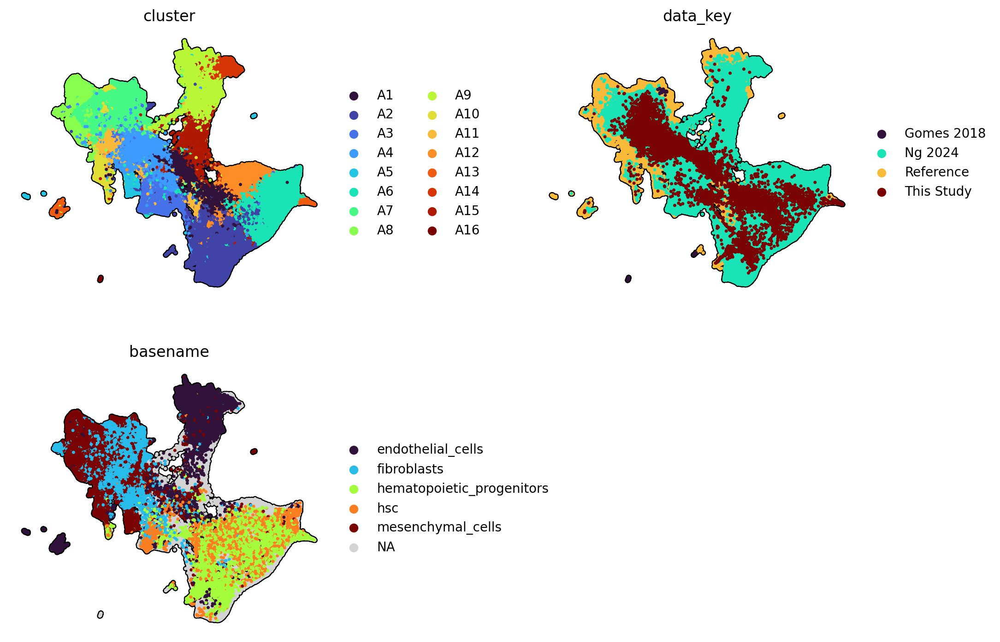

In [26]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['cluster', 'data_key', 'basename'],
    palette='turbo',
    size=25,
    ncols=2,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

... storing 'cluster' as categorical
... storing 'groups_of_interest' as categorical
... storing 'joint' as categorical


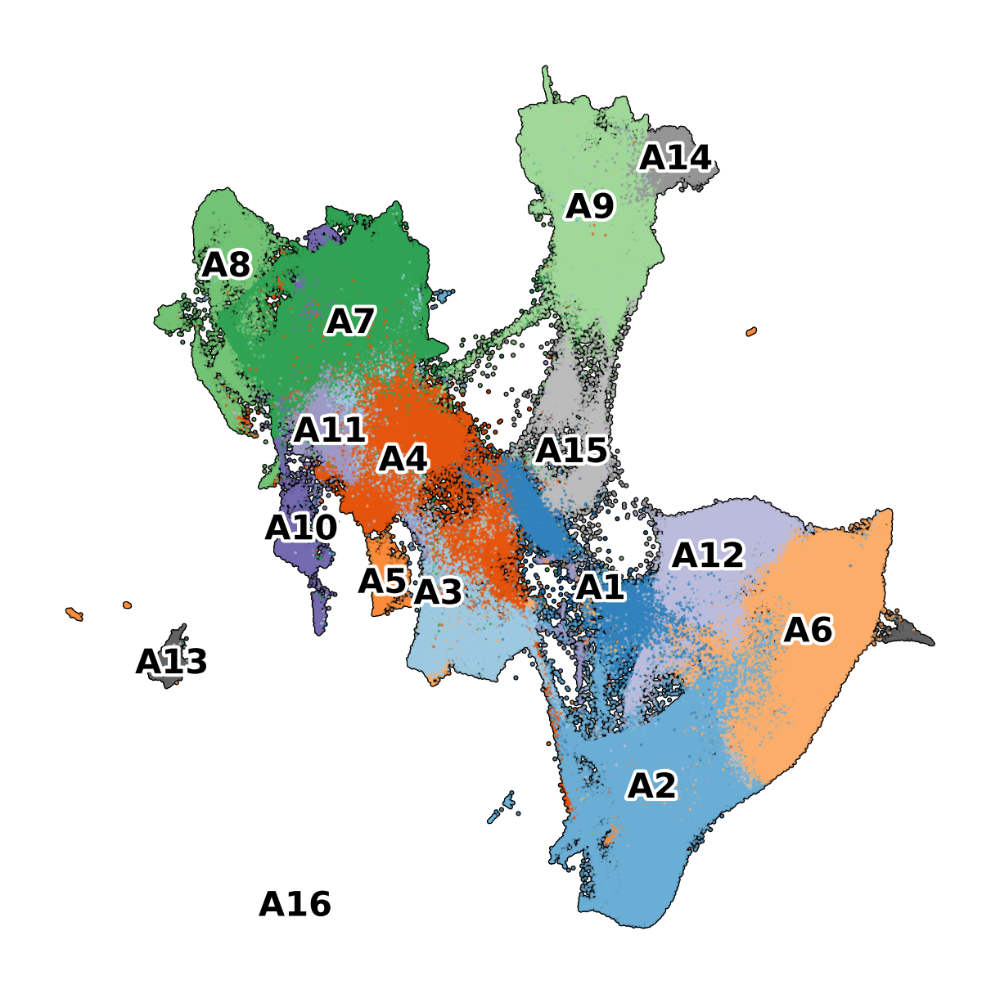

In [88]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

sc.pl.umap(
    adata,
    color='cluster',
    palette='tab20c',
    size=3,
    alpha=0.75,
    legend_loc='on data',
    legend_fontoutline=2,
    legend_fontsize='medium',#'small',
    # colorbar_loc=None,
    use_raw=False,
    add_outline=True,
    title='',
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.02,
    # hspace=0.02,
)

# Re-cluster

... storing 'cluster2' as categorical


cluster2
A9     46352
A6     41194
A10    39853
A13    38686
A17    35883
A3     31014
A1     25917
A8     22991
A15    19535
A16    19217
A2     15927
A11    15051
A12    14640
A7     14622
A4      8023
A14     6206
A5      5043
A19     4914
A18     4252
A21     3590
A22     1851
A27     1444
A23     1123
A26     1102
A25      827
A20      450
A28      201
A24      200


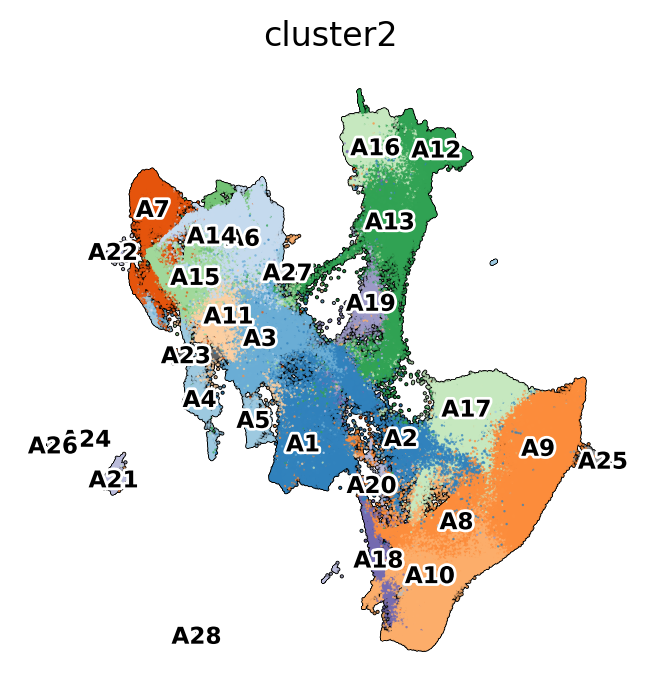

In [50]:
# rsc.get.anndata_to_GPU(adata)

# rsc.tl.leiden(adata, resolution=0.7, random_state=1729)

# rsc.get.anndata_to_CPU(adata)

# adata.obs['cluster2'] = adata.obs['leiden'].apply(lambda x: f"A{int(x) + 1}")
# adata.obs['cluster2'] = adata.obs['cluster2'].astype('str')

# print(adata.obs['cluster2'].value_counts().to_string())

# plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.figsize'] = 4, 4

# sc.pl.umap(
#     adata,
#     color='cluster2',
#     palette='tab20c',
#     size=3,
#     alpha=0.75,
#     legend_loc='on data',
#     legend_fontoutline=2,
#     legend_fontsize='small',
#     use_raw=False,
#     add_outline=True,
#     outline_color=('k', 'k'),
#     frameon=False,
#     wspace=0.02,
# )

# Dataset groupings

In [3]:
conds = [
    adata.obs['data_key'].isin(['This Study', 'Ng 2024', 'Gomes 2018']),
    adata.obs['data_key'] == 'Reference'
]

choices = [
    adata.obs['annotation'],
    adata.obs['basename']
]

adata.obs['atlas_grouping'] = np.select(conds, choices, default=np.nan)

adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype(str)

ng_grouping = {
    'HSPCs' : ['HSPC1', 'HSPC2', 'HSPC3'],
    
    'Vasculature': ['Art1', 'Art2', 'Venous'],
    
    'Stroma': ['Strom1', 'Strom2', 'Strom3', 'Strom4'],
    
    'Gran/Mono': ['Gran', 'Mono'],
    
    'Erythroid/Mega': ['Mega', 'EMK Pro1', 'EMK Pro2'],
    
    'Myeloid/Eos': ['Eos', 'Mye Pro1', 'Mye Pro2'],
    
    'Hemogenic': ['Hemogenic'],
    
    'Endo': ['Endo'],
}

# Invert the mapping: from old -> new
reverse_map = {old: new for new, olds in ng_grouping.items() for old in olds}

# Subset Ng 2024 cells
mask = adata.obs['data_key'] == 'Ng 2024'

# Replace atlas_grouping values based on mapping
adata.obs.loc[mask, 'atlas_grouping'] = (
    adata.obs.loc[mask, 'atlas_grouping']
    .replace(reverse_map)
)

# adata.obs['atlas_grouping'] = bdata.obs['atlas_grouping'].astype('category')

# bdata


new_grouping = {
    'Native HSCs': ['HSC', 'hsc'],
    'Engineered HSCs': ['R1', 'R2', 'R3', 'HSPCs', 'DAY2', 'DAY25', 'DAY15'],
    
    'Hematopoietic progenitors': ['hematopoietic_progenitors', 'progenitors', 'CLP', 'LMPP', 'UCB'],
    'Other hematopoietic': ['Gran/Mono', 'Myeloid/Eos', 'Erythroid/Mega'],
    
    'Endothelial': ['endothelial_cells', 'Hemogenic', 'Endo', 'Vasculature'],
    'Fibroblast/Stroma': ['Stroma', 'fibroblasts', 'mesenchymal_cells', 'HDF', 'initial'],
}

# Invert the mapping: from old -> new
reverse_map = {old: new for new, olds in new_grouping.items() for old in olds}


# bdata.obs['atlas_grouping'] = bdata.obs['atlas_grouping'].astype(str)

# create new grouping
adata.obs['broad_grouping'] = adata.obs['atlas_grouping'].map(reverse_map)
adata.obs['broad_grouping'] = adata.obs['broad_grouping'].astype('category')

adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype('category')

print(adata)

adata.obs['broad_grouping'].value_counts()

AnnData object with n_obs × n_vars = 420108 × 24
    obs: 'annotation', 'cell_type', 'tissue', 'development_stage', 'basename', 'dataset_id', 'data_key', 'data_source', 'celltype', 'source', 'batch_key', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'leiden', 'cluster', 'atlas_grouping', 'broad_grouping'
    uns: 'annotation_colors', 'basename_colors', 'cluster_colors', 'data_key_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


broad_grouping
Fibroblast/Stroma            141176
Other hematopoietic          118905
Endothelial                   74486
Engineered HSCs               56385
Hematopoietic progenitors     19058
Native HSCs                   10098
Name: count, dtype: int64

## This Study

In [4]:
df = adata.obs[adata.obs['data_key'] == 'This Study'].copy()
print(df.shape)

key = 'annotation'

df[key] = df[key].astype(str)
df[key].value_counts()

(20620, 37)


annotation
initial        8446
R2             4288
progenitors    2941
R1             1932
HSC            1502
R3              522
LMPP            495
CLP             494
Name: count, dtype: int64

In [4]:
%%time
# Load in original annotations
fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/three_libraries_new.h5ad"

bdata = sc.read_h5ad(fpath)
bdata

CPU times: user 1.52 s, sys: 2.2 s, total: 3.72 s
Wall time: 18.3 s


AnnData object with n_obs × n_vars = 20754 × 26933
    obs: 'dataset', 'source', 'cluster_all', 'group', 'label', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'combined_clusters', 'subgroup'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_id', 'gene_type', 'Chromosome', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_rank', 'variances', 'variances_norm', 'mito', 'filter_pass'
    uns: 'label_colors', 'label_deg', '

In [5]:
bm_labels = bdata.obs[['label']].copy()
bm_labels = bm_labels.rename(columns={'label': 'bm_label'})
print(bm_labels.shape)
bm_labels.head()

# merge with adata
adata.obs['bm_label'] = bm_labels.reindex(adata.obs.index)['bm_label']
adata.obs['bm_label'].value_counts(dropna=False)

(20754, 1)


bm_label
NaN        399488
initial      8446
R2           4288
MPP          2148
R1           1932
HSC          1502
R3            522
LMPP          495
CLP           494
MEG-ERY       439
CMP           302
GMP            52
Name: count, dtype: int64

... storing 'iHSC_annotation' as categorical


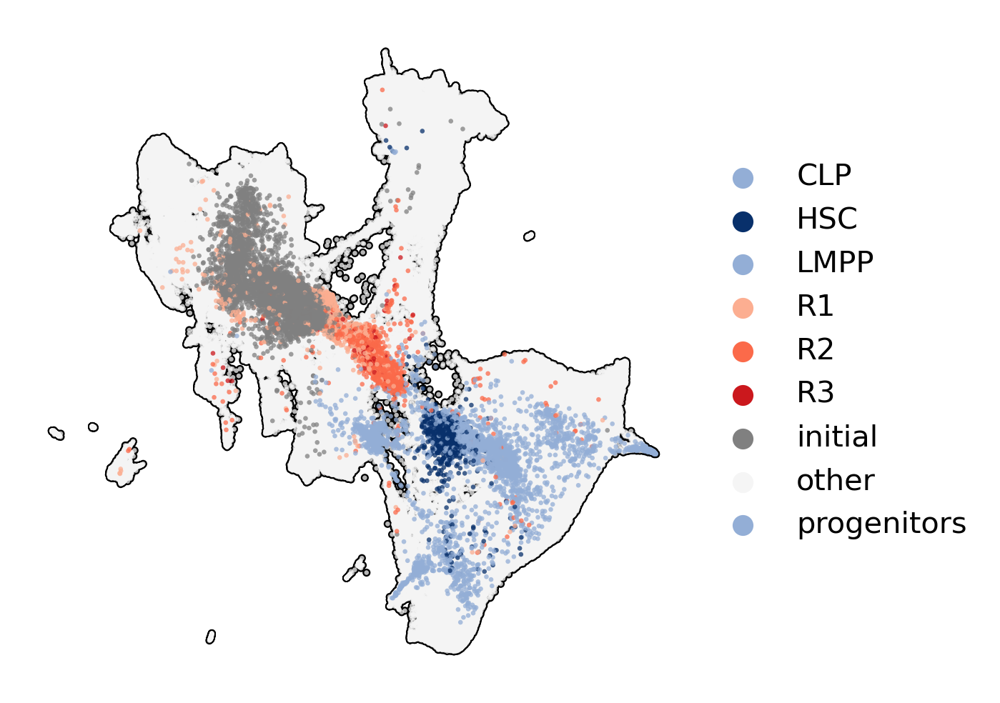

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

adata.obs['iHSC_annotation'] = np.where(adata.obs['data_key'] == 'This Study', adata.obs['annotation'], 'other')

palette = {
    # HSC group – blues
    'HSC'     : '#08306B', # dark blue
    'progenitors' : '#93AED6', # light blue
    'LMPP'    : '#93AED6', # light blue
    'CLP'     : '#93AED6', # light blue

    # reprogram group – reds
    'R1'      : '#FCAE91',
    'R2'      : '#FB6A4A',
    'R3'      : '#CB181D',

    # initial group – neutral grey
    'initial'  : '#808080',
    'other' : 'whitesmoke',
}

sc.pl.umap(
    adata,
    color='iHSC_annotation',
    palette=palette, 
    size=10,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    # legend_loc='none',
)

In [22]:
adata.obs['bm_label'].value_counts(dropna=False)

bm_label
NaN        399488
initial      8446
R2           4288
MPP          2148
R1           1932
HSC          1502
R3            522
LMPP          495
CLP           494
MEG-ERY       439
CMP           302
GMP            52
Name: count, dtype: int64

... storing 'iHSC_annotation_supp' as categorical


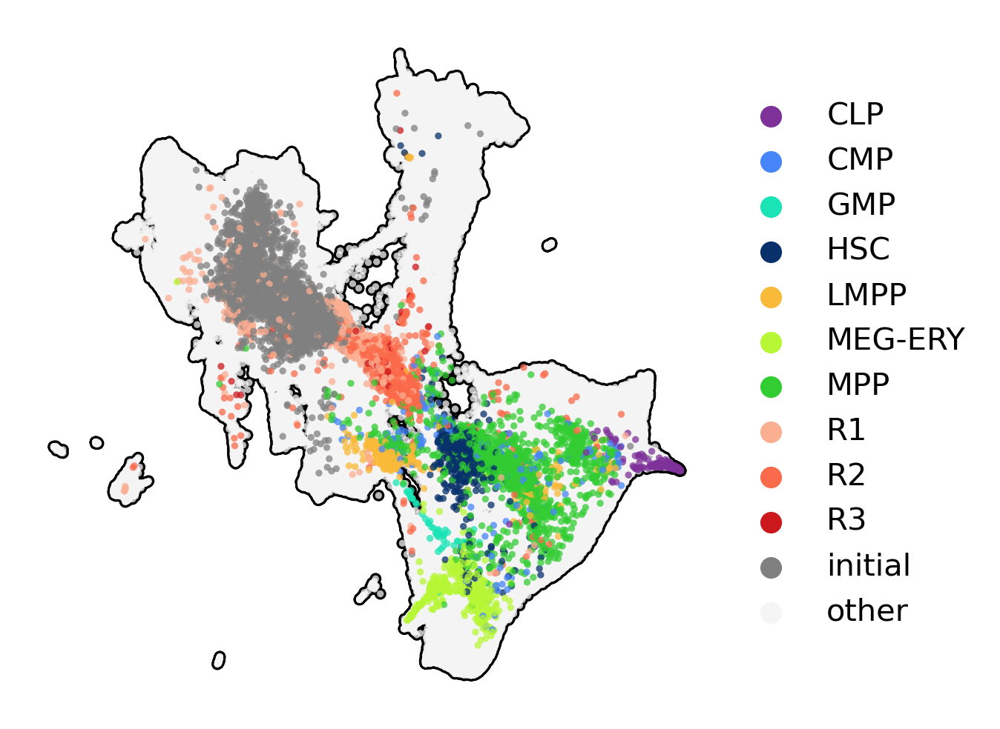

In [26]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

adata.obs['iHSC_annotation_supp'] = np.where(adata.obs['data_key'] == 'This Study', adata.obs['bm_label'], 'other')

palette = {
    # HSC group – blues
    'HSC'     : '#08306B', # dark blue
    # 'progenitors' : '#93AED6', # light blue
    'MPP'     : '#32CD32', # green
    'LMPP'    : '#FABA39', # yellow
    'CLP'     : '#7D3199', # purple
    'MEG-ERY' : '#B7F735', # bright green
    'CMP'     : '#4685FA', # blue
    'GMP'     : '#1AE4B6', # teal

    # reprogram group – reds
    'R1'      : '#FCAE91',
    'R2'      : '#FB6A4A',
    'R3'      : '#CB181D',

    # initial group – neutral grey
    'initial'  : '#808080',
    'other' : 'whitesmoke',
}

sc.pl.umap(
    adata,
    color='iHSC_annotation_supp',
    palette=palette, 
    size=20,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    # legend_loc='none',
)

## Native reference

In [28]:
adata.obs['atlas_grouping'].value_counts()

atlas_grouping
fibroblasts                  51394
mesenchymal_cells            50819
Myeloid/Eos                  50460
HSPCs                        49452
Erythroid/Mega               43596
endothelial_cells            41250
Stroma                       30479
Gran/Mono                    24849
Vasculature                  17613
hematopoietic_progenitors    15074
Hemogenic                     8983
hsc                           8596
initial                       8446
Endo                          6640
R2                            4288
progenitors                   2941
R1                            1932
HSC                           1502
R3                             522
LMPP                           495
CLP                            494
DAY25                           95
DAY15                           58
UCB                             54
HDF                             38
DAY2                            38
Name: count, dtype: int64

In [29]:
adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype(str)

is_ref = adata.obs['data_key'] == 'Reference'

keep_types = ['hsc', 'hematopoietic_progenitors', 'fibroblasts', 'mesenchymal_cells', 'endothelial_cells']
keep_mask = adata.obs['atlas_grouping'].isin(keep_types)

adata.obs['Ref_grouping'] = np.nan

# For Ng cells that are HSPCs or Stroma, keep the atlas_grouping label
adata.obs.loc[is_ref & keep_mask, 'Ref_grouping'] = adata.obs.loc[is_ref & keep_mask, 'atlas_grouping']

# For other cells, label 'other'
adata.obs.loc[is_ref & ~keep_mask, 'Ref_grouping'] = 'other'

# Quick sanity check
print(adata.obs['Ref_grouping'].value_counts(dropna=False))

Ref_grouping
NaN                          252975
fibroblasts                   51394
mesenchymal_cells             50819
endothelial_cells             41250
hematopoietic_progenitors     15074
hsc                            8596
Name: count, dtype: int64


/tmp/ipykernel_380585/438885457.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['endothelial_cells' 'mesenchymal_cells' 'hsc' ... 'mesenchymal_cells'
 'fibroblasts' 'mesenchymal_cells']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[is_ref & keep_mask, 'Ref_grouping'] = adata.obs.loc[is_ref & keep_mask, 'atlas_grouping']


... storing 'atlas_grouping' as categorical
... storing 'Ref_grouping' as categorical


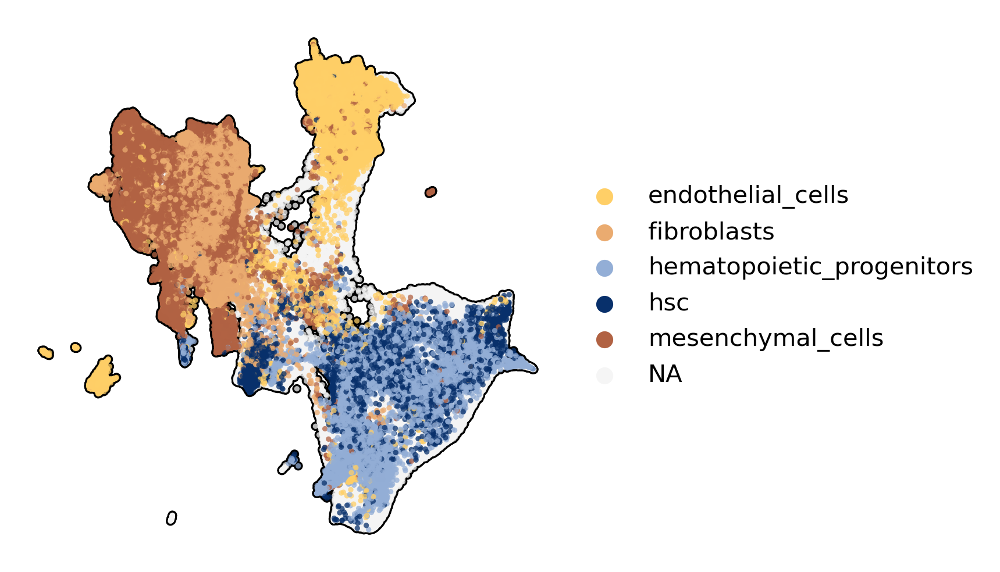

In [30]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    'hsc': '#08306B',
    'hematopoietic_progenitors': '#93AED6',
    'fibroblasts': '#EAAB70',
    'mesenchymal_cells': '#B16243',
    'endothelial_cells': '#FFCF67',
}

# mask = adata.obs['Ref_grouping'] == 'hsc'


sc.pl.umap(
    adata,
    color='Ref_grouping',
    # mask_obs=mask,
    palette=palette, 
    size=20,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    # legend_loc='none',
)

## Ng data

In [31]:
adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype(str)

is_ng = adata.obs['data_key'] == 'Ng 2024'

# keep_types = ['HSPCs', 'Stroma']
keep_types = ['HSPCs', 'Stroma', 'Vasculature', 'Gran/Mono', 'Erythroid/Mega', 'Myeloid/Eos', 'Hemogenic', 'Endo']
keep_mask = adata.obs['atlas_grouping'].isin(keep_types)

adata.obs['Ng_grouping'] = np.nan

# For Ng cells that are HSPCs or Stroma, keep the atlas_grouping label
adata.obs.loc[is_ng & keep_mask, 'Ng_grouping'] = adata.obs.loc[is_ng & keep_mask, 'atlas_grouping']

# For other Ng cells, label 'other'
adata.obs.loc[is_ng & ~keep_mask, 'Ng_grouping'] = 'other'

# # Make categorical with an explicit order (optional)
# cat_order = ['other', 'Stroma', 'HSPCs']
# adata.obs['Ng_grouping'] = pd.Categorical(adata.obs['Ng_grouping'], categories=cat_order, ordered=True)

# Quick sanity check
adata.obs['Ng_grouping'].value_counts(dropna=False)

/tmp/ipykernel_380585/3378964140.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['Erythroid/Mega' 'HSPCs' 'Myeloid/Eos' ... 'Myeloid/Eos' 'Endo'
 'Gran/Mono']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[is_ng & keep_mask, 'Ng_grouping'] = adata.obs.loc[is_ng & keep_mask, 'atlas_grouping']


Ng_grouping
NaN               188036
Myeloid/Eos        50460
HSPCs              49452
Erythroid/Mega     43596
Stroma             30479
Gran/Mono          24849
Vasculature        17613
Hemogenic           8983
Endo                6640
Name: count, dtype: int64

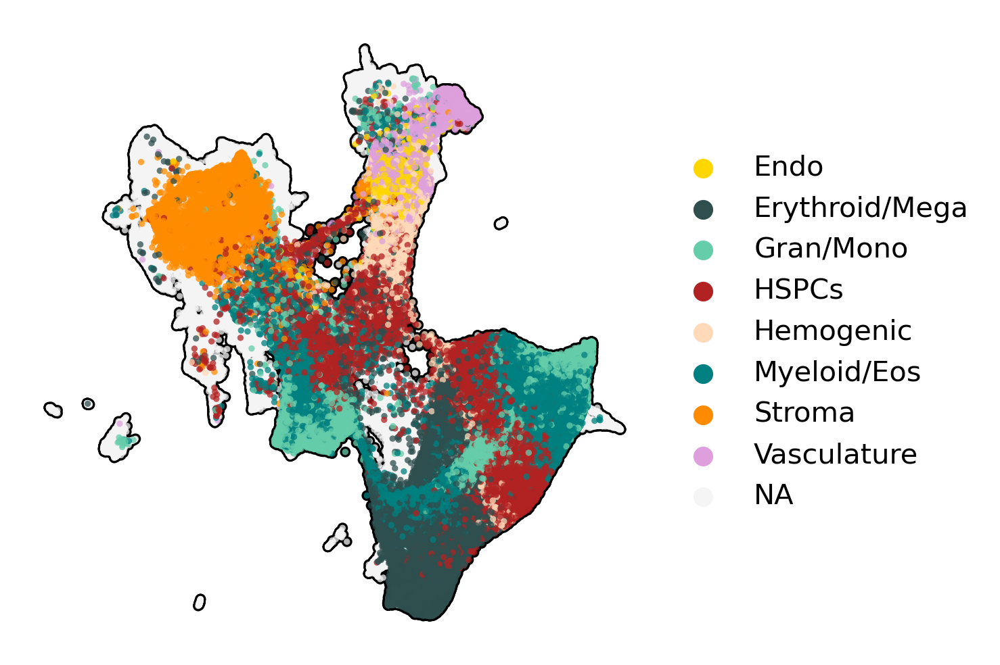

In [35]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    'HSPCs': 'firebrick',
    'Stroma': 'darkorange',
    'Vasculature': 'plum',
    'Gran/Mono': 'mediumaquamarine',
    'Erythroid/Mega': 'darkslategray',
    'Myeloid/Eos': 'teal',
    'Hemogenic': 'peachpuff',
    'Endo': 'gold',
    'other': 'whitesmoke',
}

sc.pl.umap(
    adata,
    color='Ng_grouping',
    palette=palette, 
    size=20,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    # legend_loc='none',
)

In [41]:
adata.obs['annotation'] = adata.obs['annotation'].astype(str)

is_ng = adata.obs['data_key'] == 'Ng 2024'

keep_types = ['HSPC1', 'HSPC2', 'HSPC3']

keep_mask = adata.obs['annotation'].isin(keep_types)

adata.obs['Ng_grouping_hspc'] = np.nan

# For Ng cells that are HSPCs or Stroma, keep the atlas_grouping label
adata.obs.loc[is_ng & keep_mask, 'Ng_grouping_hspc'] = adata.obs.loc[is_ng & keep_mask, 'annotation']

# For other Ng cells, label 'other'
adata.obs.loc[is_ng & ~keep_mask, 'Ng_grouping_hspc'] = 'other'

# Quick sanity check
adata.obs['Ng_grouping_hspc'].value_counts(dropna=False)

/tmp/ipykernel_3343537/2445345497.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['HSPC2' 'HSPC1' 'HSPC1' ... 'HSPC1' 'HSPC1' 'HSPC2']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[is_ng & keep_mask, 'Ng_grouping_hspc'] = adata.obs.loc[is_ng & keep_mask, 'annotation']


Ng_grouping_hspc
NaN      188036
other    182620
HSPC1     35304
HSPC2     10534
HSPC3      3614
Name: count, dtype: int64

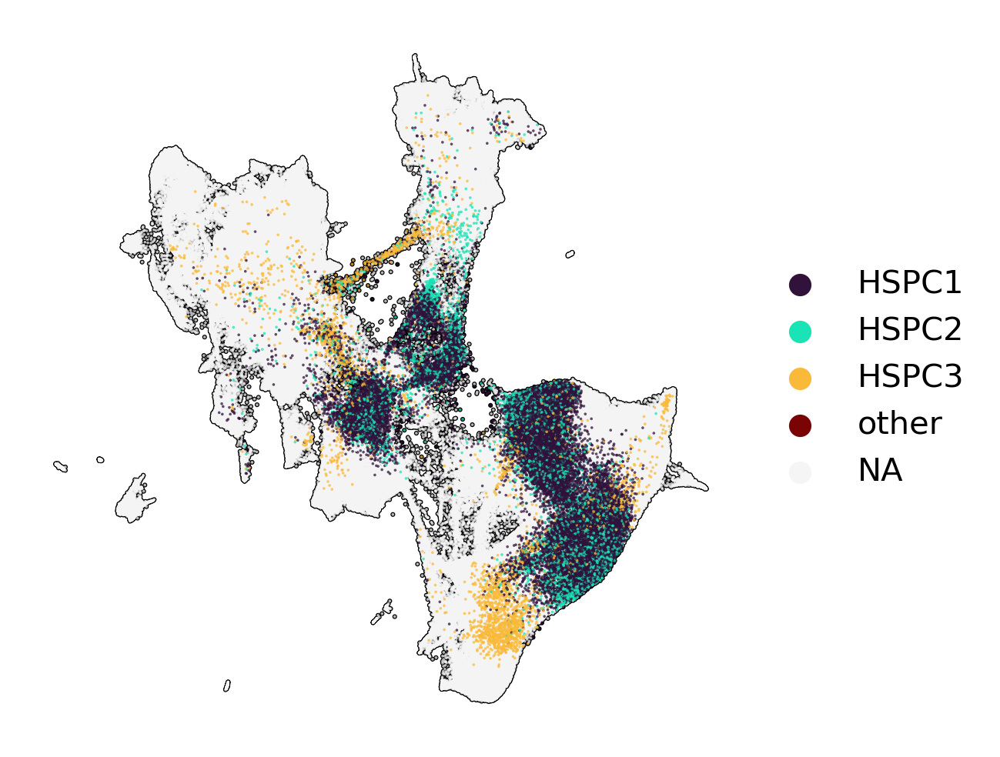

In [43]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

mask = adata.obs['annotation'].isin(['HSPC1', 'HSPC2', 'HSPC3'])

sc.pl.umap(
    adata,
    color='Ng_grouping_hspc',
    mask_obs=mask,
    palette='turbo', 
    size=3,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    # legend_loc='none',
)

## Gomes data

In [38]:
df = adata.obs[adata.obs['data_key'] == 'Gomes 2018'].copy()
print(df.shape)

key = 'atlas_grouping'

df[key] = df[key].astype(str)
df[key].value_counts()

(283, 44)


atlas_grouping
DAY25    95
DAY15    58
UCB      54
HDF      38
DAY2     38
Name: count, dtype: int64

In [39]:
adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype(str)

is_gomes = adata.obs['data_key'] == 'Gomes 2018'

keep_types = ['DAY2', 'DAY15', 'DAY25', 'HDF', 'UCB']
keep_mask = adata.obs['atlas_grouping'].isin(keep_types)

adata.obs['Gomes_grouping'] = np.nan

# For Ng cells that are HSPCs or Stroma, keep the atlas_grouping label
adata.obs.loc[is_gomes & keep_mask, 'Gomes_grouping'] = adata.obs.loc[is_gomes & keep_mask, 'atlas_grouping']

# For other Ng cells, label 'other'
adata.obs.loc[is_gomes & ~keep_mask, 'Gomes_grouping'] = 'other'

# Quick sanity check
adata.obs['Gomes_grouping'].value_counts(dropna=False)

/tmp/ipykernel_380585/2607617964.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['DAY15' 'HDF' 'UCB' 'HDF' 'DAY15' 'DAY25' 'UCB' 'DAY15' 'HDF' 'UCB'
 'DAY25' 'UCB' 'DAY25' 'UCB' 'DAY25' 'UCB' 'DAY25' 'UCB' 'UCB' 'DAY25'
 'DAY25' 'DAY15' 'DAY2' 'DAY2' 'UCB' 'DAY2' 'DAY2' 'DAY2' 'UCB' 'UCB'
 'HDF' 'DAY15' 'DAY25' 'UCB' 'DAY2' 'UCB' 'UCB' 'DAY2' 'DAY15' 'DAY25'
 'DAY2' 'DAY25' 'DAY25' 'DAY15' 'DAY2' 'DAY2' 'DAY15' 'DAY25' 'DAY25'
 'DAY2' 'UCB' 'DAY2' 'DAY15' 'UCB' 'DAY25' 'DAY25' 'DAY25' 'HDF' 'DAY15'
 'DAY25' 'DAY15' 'UCB' 'HDF' 'HDF' 'UCB' 'UCB' 'DAY25' 'UCB' 'DAY15'
 'DAY25' 'HDF' 'DAY25' 'DAY2' 'DAY2' 'DAY15' 'HDF' 'DAY15' 'HDF' 'DAY15'
 'DAY25' 'HDF' 'UCB' 'UCB' 'DAY25' 'HDF' 'DAY15' 'UCB' 'UCB' 'DAY2'
 'DAY25' 'HDF' 'DAY15' 'DAY25' 'DAY15' 'DAY25' 'DAY25' 'HDF' 'DAY15'
 'DAY15' 'DAY25' 'HDF' 'UCB' 'UCB' 'DAY15' 'DAY25' 'DAY2' 'DAY25' 'DAY25'
 'DAY25' 'DAY25' 'DAY25' 'DAY15' 'DAY25' 'UCB' 'UCB' '

Gomes_grouping
NaN      419825
DAY25        95
DAY15        58
UCB          54
HDF          38
DAY2         38
Name: count, dtype: int64

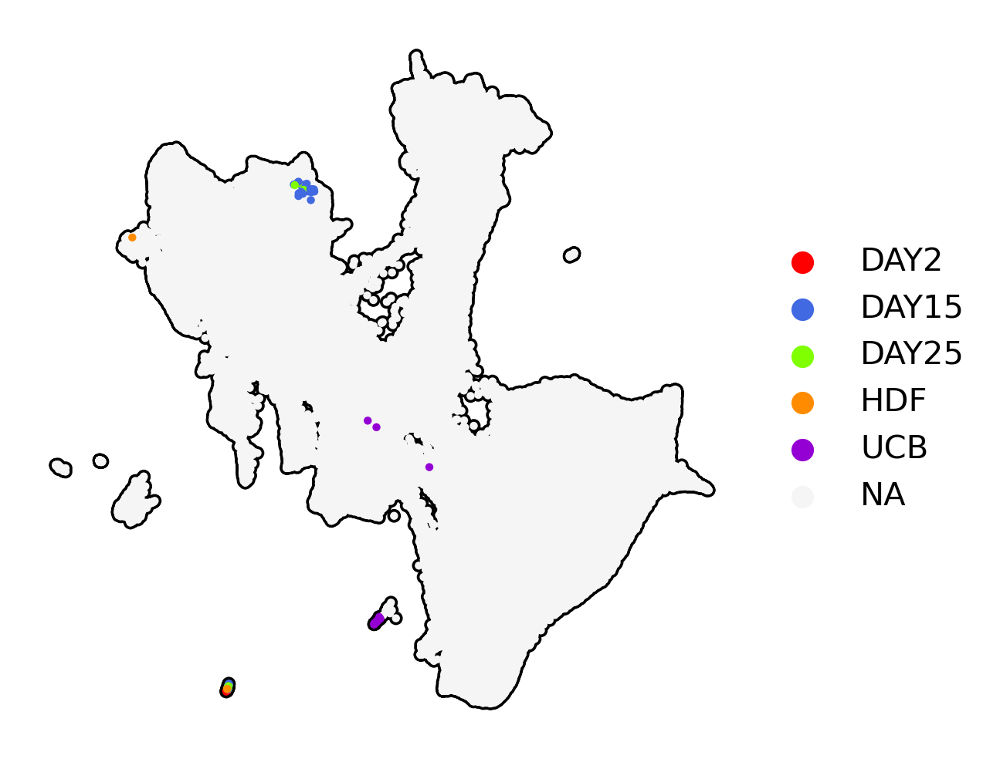

In [45]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    'DAY2': 'red',
    'DAY15': 'royalblue',
    'DAY25': 'chartreuse',
    'HDF': 'darkorange',
    'UCB': 'darkviolet',
}

sc.pl.umap(
    adata,
    color='Gomes_grouping',
    palette=palette, 
    size=25,
    ncols=1,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    # legend_loc='none',
)

## groups of interest

In [7]:
adata.obs['atlas_grouping'].value_counts()

atlas_grouping
fibroblasts                  51394
mesenchymal_cells            50819
Myeloid/Eos                  50460
HSPCs                        49452
Erythroid/Mega               43596
endothelial_cells            41250
Stroma                       30479
Gran/Mono                    24849
Vasculature                  17613
hematopoietic_progenitors    15074
Hemogenic                     8983
hsc                           8596
initial                       8446
Endo                          6640
R2                            4288
progenitors                   2941
R1                            1932
HSC                           1502
R3                             522
LMPP                           495
CLP                            494
DAY25                           95
DAY15                           58
UCB                             54
HDF                             38
DAY2                            38
Name: count, dtype: int64

In [8]:
adata.obs['atlas_grouping'] = adata.obs['atlas_grouping'].astype(str)

# is_ng = adata.obs['data_key'] == 'Ng 2024'

keep_types = ['R1', 'R2', 'R3', 'HSC', 'HSPCs', 'hsc', 'hematopoietic_progenitors', 'initial', 'fibroblasts', 'endothelial_cells']

keep_mask = adata.obs['atlas_grouping'].isin(keep_types)

adata.obs['groups_of_interest'] = np.nan


adata.obs.loc[keep_mask, 'groups_of_interest'] = adata.obs.loc[keep_mask, 'atlas_grouping']

# For other cells, label 'other'
# adata.obs.loc[~keep_mask, 'groups_of_interest'] = 'other'

# Quick sanity check
adata.obs['groups_of_interest'].value_counts(dropna=False)

/tmp/ipykernel_2673546/414817324.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['endothelial_cells' 'hsc' 'fibroblasts' ... 'R1' 'initial' 'initial']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[keep_mask, 'groups_of_interest'] = adata.obs.loc[keep_mask, 'atlas_grouping']


groups_of_interest
NaN                          237652
fibroblasts                   51394
HSPCs                         49452
endothelial_cells             41250
hematopoietic_progenitors     15074
hsc                            8596
initial                        8446
R2                             4288
R1                             1932
HSC                            1502
R3                              522
Name: count, dtype: int64

... storing 'atlas_grouping' as categorical
... storing 'groups_of_interest' as categorical


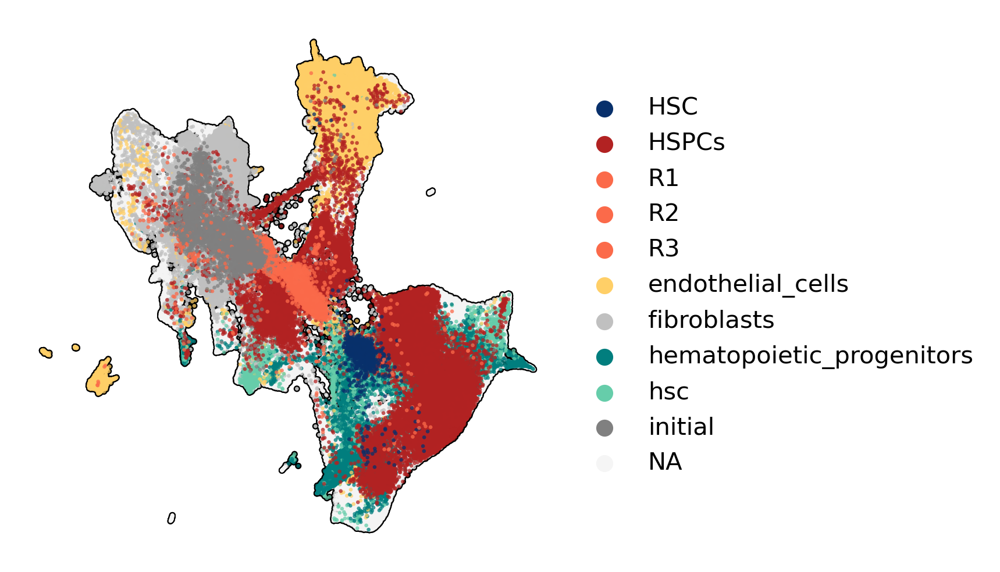

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

palette = {
    'R1': '#FB6A4A',
    'R2': '#FB6A4A',
    'R3': '#FB6A4A',
    'initial': '#808080',
    'fibroblasts': 'silver',
    'HSC': '#08306B',
    'hsc': '#66CDAA', # light teal
    'hematopoietic_progenitors': '#017E7E', # dark teal
    'HSPCs': 'firebrick',
    'endothelial_cells': '#FFCF67', # yellow
    # 'other': 'whitesmoke',
}

sc.pl.umap(
    adata,
    color='groups_of_interest',
    palette=palette, 
    size=10,
    ncols=1,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    # legend_loc='none',
)

In [9]:
counts = pd.crosstab(
        adata.obs['cluster'],
        adata.obs['groups_of_interest'],
        normalize='columns'
)

counts

groups_of_interest,HSC,HSPCs,R1,R2,R3,endothelial_cells,fibroblasts,hematopoietic_progenitors,hsc,initial
cluster,,,,,,,,,,
A1,0.894141,0.007967,0.519669,0.915112,0.921456,0.006230,0.001693,0.172283,0.265821,0.002723
A2,0.050599,0.067662,0.002070,0.002099,0.001916,0.002279,0.001167,0.434125,0.122150,0.000000
A3,0.000000,0.014054,0.002588,0.000700,0.000000,0.002230,0.204557,0.017049,0.104118,0.018944
A4,0.000000,0.078864,0.382505,0.051539,0.055556,0.006909,0.181675,0.001592,0.007678,0.777173
A5,0.000000,0.001112,0.000518,0.000233,0.000000,0.028606,0.002393,0.001526,0.001512,0.000710
A6,0.008655,0.335052,0.004141,0.007696,0.000000,0.000800,0.000428,0.234642,0.315612,0.000118
A7,0.000000,0.007078,0.036749,0.000000,0.000000,0.001818,0.409192,0.000066,0.001978,0.107980
A8,0.000000,0.000101,0.004141,0.000000,0.000000,0.005139,0.047048,0.000199,0.000814,0.000592
A9,0.005326,0.014438,0.001035,0.000933,0.001916,0.829745,0.001848,0.000730,0.001512,0.002131


# Engineered vs native grouping

In [4]:
adata.obs['atlas_grouping'].value_counts()

atlas_grouping
fibroblasts                  51394
mesenchymal_cells            50819
Myeloid/Eos                  50460
HSPCs                        49452
Erythroid/Mega               43596
endothelial_cells            41250
Stroma                       30479
Gran/Mono                    24849
Vasculature                  17613
hematopoietic_progenitors    15074
Hemogenic                     8983
hsc                           8596
initial                       8446
Endo                          6640
R2                            4288
progenitors                   2941
R1                            1932
HSC                           1502
R3                             522
LMPP                           495
CLP                            494
DAY25                           95
DAY15                           58
UCB                             54
HDF                             38
DAY2                            38
Name: count, dtype: int64

In [7]:
# create engineered vs native grouping column
adata.obs['is_engineered'] = np.nan

adata.obs.loc[adata.obs['data_key'] == 'Ng 2024', 'is_engineered'] = 'Engineered'
adata.obs.loc[adata.obs['data_key'] == 'Reference', 'is_engineered'] = 'Native'

engineered_groups = ['DAY2', 'DAY15', 'DAY25', 'R1', 'R2', 'R3']
native_groups = ['HDF', 'UCB', 'initial', 'HSC', 'progenitors', 'CLP', 'LMPP']

mask = adata.obs['data_key'].isin(['This Study', 'Gomes 2018'])

adata.obs.loc[mask & adata.obs['atlas_grouping'].isin(engineered_groups), 'is_engineered'] = 'Engineered'
adata.obs.loc[mask & adata.obs['atlas_grouping'].isin(native_groups), 'is_engineered'] = 'Native'

adata.obs['is_engineered'].value_counts()

/tmp/ipykernel_1990719/3843105414.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Engineered' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata.obs['data_key'] == 'Ng 2024', 'is_engineered'] = 'Engineered'


is_engineered
Engineered    239005
Native        181103
Name: count, dtype: int64

... storing 'is_engineered' as categorical


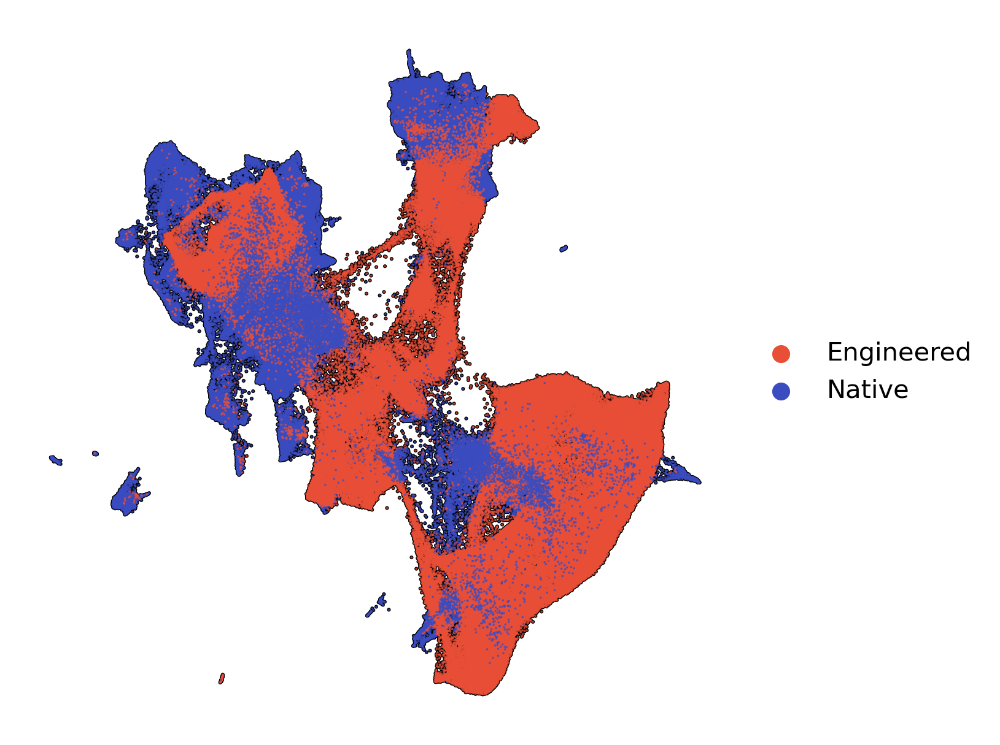

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

ax = sc.pl.umap(
    adata,
    color='is_engineered',
    # palette=['#3B4CC0', '#E94F37'], # blue, red
    palette=['#E94F37', '#3B4CC0'], # red, blue
    size=3,
    alpha=0.75,
    use_raw=False,
    add_outline=True,
    title='',
    outline_color=('k', 'k'),
    frameon=False,
    show=False,
)

ax.set_facecolor('none')    # axes background
plt.gcf().set_facecolor('none')

In [8]:
not_dataset = "whitesmoke"
engineered = '#E94F37'  # red
native = '#3B4CC0'      # blue

data_keys = adata.obs['data_key'].unique()

for key in data_keys:
    in_key = (adata.obs['data_key'] == key)

    # # Restrict the engineered check to this dataset only
    engineered_mask = in_key & (adata.obs['is_engineered'] == 'Engineered')
    native_mask = in_key & (adata.obs['is_engineered'] == 'Native')

    # Combine into numeric codes: 0 = not dataset, 1 = native, 2 = engineered
    plot_values = np.select(
        [native_mask, engineered_mask],
        [1, 2],
        default=0
    )

    adata.obs[f"{key}_binary"] = plot_values
    
adata.obs[[f"{k}_binary" for k in data_keys]].head()

,Reference_binary,Ng 2024_binary,Gomes 2018_binary,This Study_binary
346815,1,0,0,0
243440,1,0,0,0
2479,1,0,0,0
30718,1,0,0,0
793668,1,0,0,0


... storing 'is_engineered' as categorical


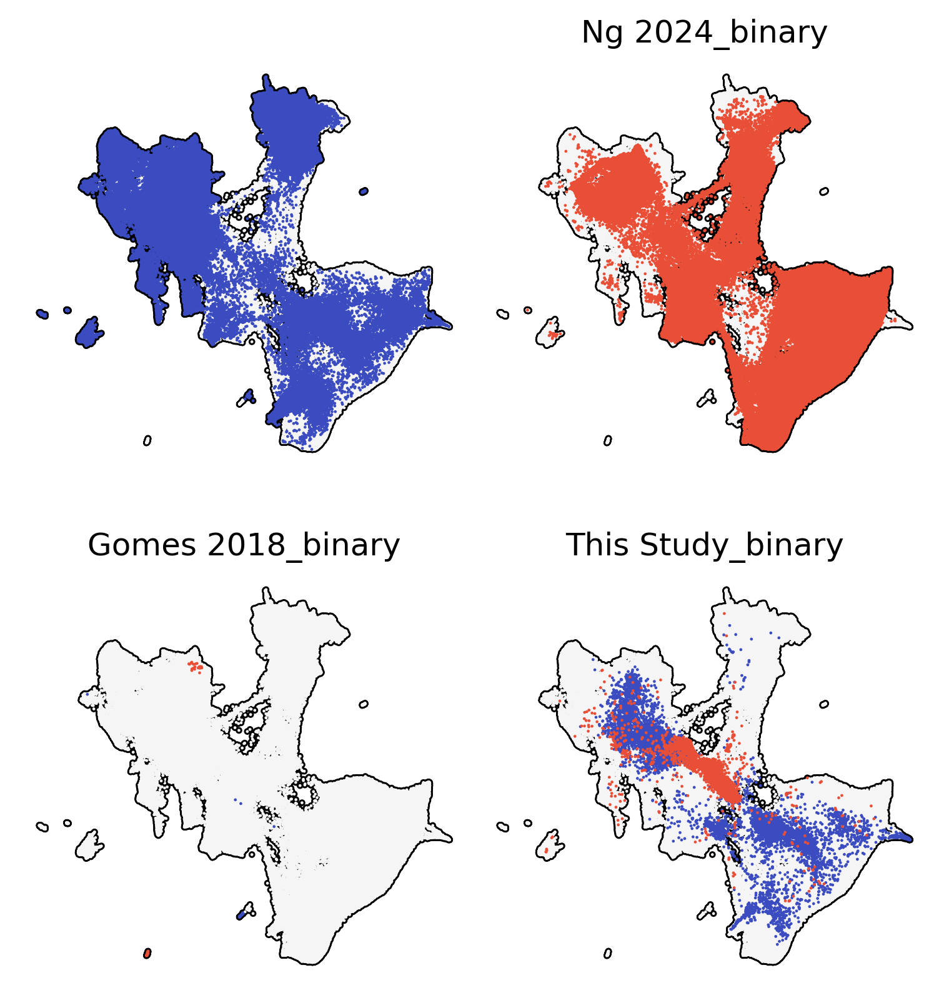

In [10]:
from matplotlib.colors import ListedColormap

cmap = ListedColormap([not_dataset, native, engineered])
# cmap = ListedColormap([not_dataset, engineered, native])

colors = [col for col in adata.obs.columns if 'binary' in col]
colors


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=colors,#['Gomes 2018_binary'],
    cmap=cmap,
    ncols=2,
    size=5,
    vmin=0,
    vmax=2,
    alpha=1, # 0.6
    legend_loc=None,
    colorbar_loc=None,
    use_raw=False,
    add_outline=True,
    # title='',
    outline_color=('k', 'k'),
    outline_width=(0.6, 0.05),
    frameon=False,
    wspace=0.02,
)

In [11]:
adata.obs['atlas_grouping'].value_counts()

atlas_grouping
fibroblasts                  51394
mesenchymal_cells            50819
Myeloid/Eos                  50460
HSPCs                        49452
Erythroid/Mega               43596
endothelial_cells            41250
Stroma                       30479
Gran/Mono                    24849
Vasculature                  17613
hematopoietic_progenitors    15074
Hemogenic                     8983
hsc                           8596
initial                       8446
Endo                          6640
R2                            4288
progenitors                   2941
R1                            1932
HSC                           1502
R3                             522
LMPP                           495
CLP                            494
DAY25                           95
DAY15                           58
UCB                             54
HDF                             38
DAY2                            38
Name: count, dtype: int64

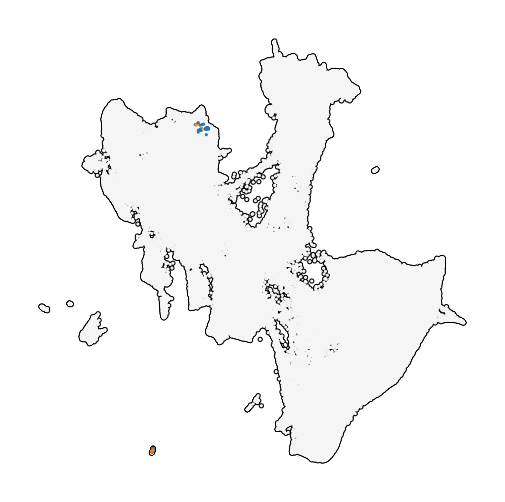

In [20]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3


# mask = adata.obs['atlas_grouping'] == 'hsc'
mask = adata.obs['atlas_grouping'].isin(['DAY25', 'DAY15'])

sc.pl.umap(
    adata,
    color='atlas_grouping',
    mask_obs=mask,
    palette='tab20', 
    size=5,
    ncols=1,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    na_color='whitesmoke',
    legend_loc='none',
)

# Distances

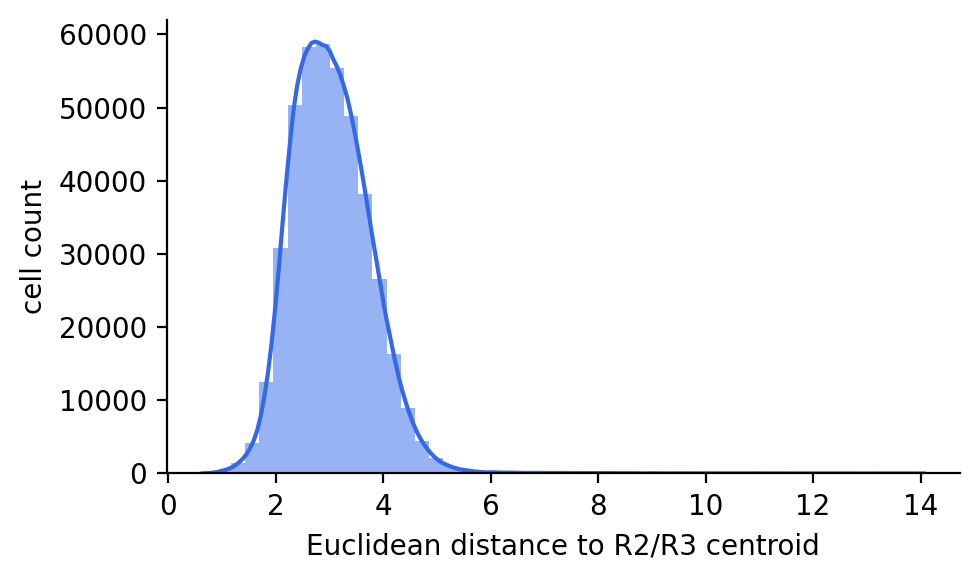

CPU times: user 1.51 s, sys: 70.5 ms, total: 1.58 s
Wall time: 2.19 s


In [8]:
%%time

# Step 1: Identify indices of cluster C3
cluster = 'R2/R3'

a8_mask = (adata.obs['annotation'] == 'R2') | (adata.obs['annotation'] == 'R3')

# cluster = 'R2'
# a8_mask = adata.obs['annotation'] == cluster

a8_X_cpu = adata.X[a8_mask]

# Step 2: Move A8 data to GPU and compute centroid
a8_X_gpu = cp.asarray(a8_X_cpu.toarray() if hasattr(a8_X_cpu, "toarray") else a8_X_cpu)
centroid = cp.mean(a8_X_gpu, axis=0)

# Step 3: Move full matrix to GPU
X_gpu = cp.asarray(adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X)

# Step 4: Compute Euclidean distances to centroid
# dist_i = ||x_i - centroid||_2
dists = cp.linalg.norm(X_gpu - centroid, axis=1)

# Step 5: Bring back to CPU and store in adata.obs
adata.obs[f'dist_to_{cluster}_centroid'] = cp.asnumpy(dists)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3

# Histogram with KDE
sns.histplot(
    adata.obs[f'dist_to_{cluster}_centroid'],
    bins=51,
    kde=True,
    color="#3369E8",  # pleasant blue
    edgecolor=None
)

# Labeling
plt.xlabel(f"Euclidean distance to {cluster} centroid")
plt.ylabel("cell count")

# Remove spines and tighten layout
sns.despine()
plt.tight_layout()
plt.show()

/tmp/ipykernel_3343537/1455037777.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(grouping_key)[f"dist_to_{cluster}_centroid"]


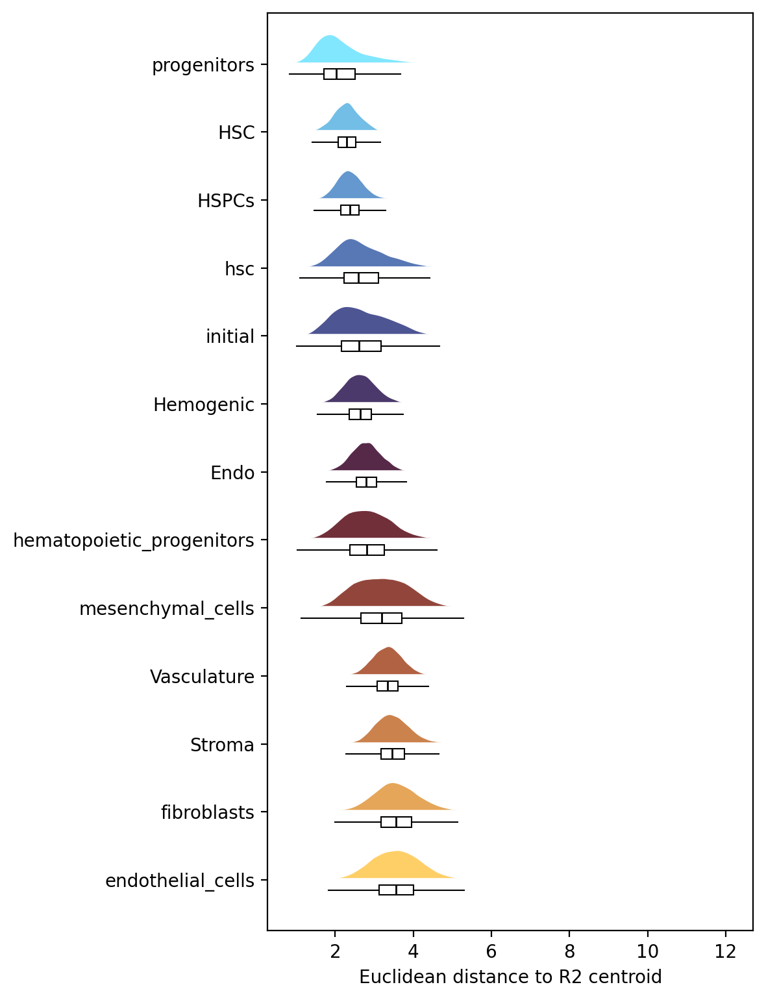

In [37]:
grouping_key = 'atlas_grouping'

# Compute mean distance to A8 centroid for each cluster
cluster_means = (
    adata.obs.groupby(grouping_key)[f"dist_to_{cluster}_centroid"]
    .median()
    # .mean()
    .sort_values()
    # .head()
)

groups_to_plot = [
    'HSC', 'hsc',# target
    'initial', 'fibroblasts', 
    'progenitors', 'hematopoietic_progenitors', # progenitors (native)
    'endothelial_cells', 'Endo', 'Hemogenic', # endothelial
    'HSPCs', # engineered HSCs
    'mesenchymal_cells', # other native
    'Vasculature', 'Stroma',
]

top_clusters = cluster_means.index.tolist()
top_clusters = [x for x in top_clusters if x in groups_to_plot]

df = adata.obs[adata.obs[grouping_key].isin(top_clusters)].copy()


# Prepare DataFrame for plotting
plot_df = pd.DataFrame({
    "distance": df[f"dist_to_{cluster}_centroid"],
    "cluster": df[grouping_key]
})

# Sort cluster order for plot
plot_df["cluster"] = pd.Categorical(plot_df["cluster"], categories=top_clusters, ordered=True)



# label_map = {
#     # 'hsc': '* HSCs',
#     'intial': 'Fibroblasts (Initial)',
#     # 'fibroblasts': '* Fibroblasts',
#     # 'hematopoietic_progenitors': '* Hematopoietic progenitors',
#     'progenitors': 'Hematopoietic progenitors',
#     'endothelial_cells': 'Endothelial cells',
#     'HSPCs': 'Engineered HSPCs',
#     'HSC': 'HSCs (Target)',
#     'mesenchymal_cells': 'Mesenchymal cells',
# }


# group_order = plot_df["cluster"].cat.categories
group_order = plot_df["cluster"].cat.categories[::-1]
group_colors = plt.get_cmap('managua')(np.linspace(0, 1, len(group_order)))
violin_width = 0.85
box_width = 0.15
# offset = violin_width / 4 - box_width / 4
offset = -0.15

fig, ax = plt.subplots(figsize=(6, len(group_order) * 0.6), dpi=200)

for i, (group, color) in enumerate(zip(group_order, group_colors)):
    vals = plot_df.loc[plot_df["cluster"] == group, "distance"].dropna()
    y_pos = i  # y-axis position for current group

    # --- Half Violin (right half only) ---
    # quantiles = [[0.02, 0.98]]
    parts = ax.violinplot(
        vals, positions=[y_pos],
        vert=False,  # horizontal!
        widths=violin_width,
        showmeans=False, showmedians=False, showextrema=False,
        # quantiles=quantiles,
    )
    for pc in parts['bodies']:
        verts = pc.get_paths()[0].vertices
        mean_y = np.mean(verts[:, 1])
        verts[:, 1] = np.maximum(verts[:, 1], mean_y)  # keep right half
        pc.set_facecolor(color)
        pc.set_alpha(1)
        # # clips tails
        # lower, upper = np.percentile(vals, [1, 99])
        # verts[:, 0] = np.clip(verts[:, 0], lower, upper)

    # --- Boxplot (offset slightly up for visual separation) ---
    box = ax.boxplot(
        vals, positions=[y_pos + offset],
        vert=False,
        widths=box_width,
        patch_artist=True,
        showcaps=False, showfliers=False,
        whiskerprops={"linewidth": 0.75},
        medianprops={"color": "black", "linewidth": 1},
        boxprops={'facecolor': 'white', 'edgecolor': "black", 'linewidth': 0.75},
    )

    # # Optional: add mean/median marker
    # mean_x = vals.mean()
    # ax.plot(mean_x, y_pos, marker='|', color='white', markersize=8, zorder=10)

for i in range(len(group_order)):
    ax.axhline(i, color='white', linewidth=2, zorder=1)
    
# ax.set_xlim([2, 10])
# Set y-ticks/labels
ax.set_ylim(-0.75, len(group_order) - 0.25)
ax.set_yticks(range(len(group_order)))
ax.set_yticklabels(group_order, fontsize=10)
# ax.set_yticklabels([label_map.get(g, g) for g in group_order], fontsize=10)
ax.set_ylabel("")
ax.set_xlabel(f"Euclidean distance to {cluster} centroid")
plt.tight_layout()
plt.show()

In [20]:
adata

AnnData object with n_obs × n_vars = 420108 × 24
    obs: 'annotation', 'cell_type', 'tissue', 'development_stage', 'basename', 'dataset_id', 'data_key', 'data_source', 'celltype', 'source', 'batch_key', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'leiden', 'cluster', 'atlas_grouping', 'broad_grouping', 'groups_of_interest', 'dist_to_R2/R3_centroid', 'joint'
    uns: 'annotation_colors', 'basename_colors', 'cluster_colors', 'data_key_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

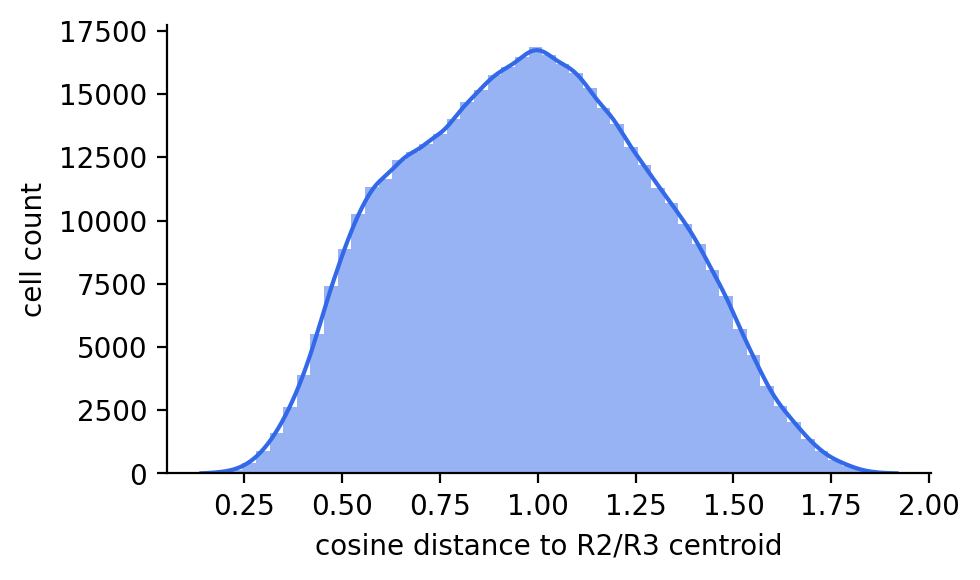

CPU times: user 1.6 s, sys: 38.6 ms, total: 1.64 s
Wall time: 1.65 s


In [24]:
%%time

distance_metric = 'cosine'


# Step 1: Identify indices of cluster C3
cluster = 'R2/R3'

a8_mask = (adata.obs['annotation'] == 'R2') | (adata.obs['annotation'] == 'R3')
# cluster = 'R2'
# a8_mask = adata.obs['annotation'] == cluster
a8_X_cpu = adata.X[a8_mask]

# Step 2: Move A8 data to GPU and compute centroid
a8_X_gpu = cp.asarray(a8_X_cpu.toarray() if hasattr(a8_X_cpu, "toarray") else a8_X_cpu)
centroid = cp.mean(a8_X_gpu, axis=0)

# Step 3: Move full matrix to GPU
X_gpu = cp.asarray(adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X)

# Step 4: Compute distances to centroid
if distance_metric == 'euclidean':
    # dist_i = ||x_i - centroid||_2
    dists = cp.linalg.norm(X_gpu - centroid, axis=1)
    
elif distance_metric == 'cosine':
    dists = 1 - cp.sum(X_gpu * centroid, axis=1) / (cp.linalg.norm(X_gpu, axis=1) * cp.linalg.norm(centroid))
    
else:
    raise ValueError(f"Unknown distance metric: {distance_metric}")

    
# Step 5: Bring back to CPU and store in adata.obs
adata.obs[f'dist_to_{cluster}_centroid'] = cp.asnumpy(dists)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3

# Histogram with KDE
sns.histplot(
    adata.obs[f'dist_to_{cluster}_centroid'],
    bins=51,
    kde=True,
    color="#3369E8",  # pleasant blue
    edgecolor=None
)

# Labeling
plt.xlabel(f"{distance_metric} distance to {cluster} centroid")
plt.ylabel("cell count")

# Remove spines and tighten layout
sns.despine()
plt.tight_layout()
plt.show()

In [11]:
counts = pd.crosstab(
        adata.obs['cluster'],
        adata.obs['groups_of_interest'],
        normalize='columns'
)

counts

groups_of_interest,HSC,HSPCs,R1,R2,R3,endothelial_cells,fibroblasts,hematopoietic_progenitors,hsc,initial
cluster,,,,,,,,,,
A1,0.894141,0.007967,0.519669,0.915112,0.921456,0.006230,0.001693,0.172283,0.265821,0.002723
A2,0.050599,0.067662,0.002070,0.002099,0.001916,0.002279,0.001167,0.434125,0.122150,0.000000
A3,0.000000,0.014054,0.002588,0.000700,0.000000,0.002230,0.204557,0.017049,0.104118,0.018944
A4,0.000000,0.078864,0.382505,0.051539,0.055556,0.006909,0.181675,0.001592,0.007678,0.777173
A5,0.000000,0.001112,0.000518,0.000233,0.000000,0.028606,0.002393,0.001526,0.001512,0.000710
A6,0.008655,0.335052,0.004141,0.007696,0.000000,0.000800,0.000428,0.234642,0.315612,0.000118
A7,0.000000,0.007078,0.036749,0.000000,0.000000,0.001818,0.409192,0.000066,0.001978,0.107980
A8,0.000000,0.000101,0.004141,0.000000,0.000000,0.005139,0.047048,0.000199,0.000814,0.000592
A9,0.005326,0.014438,0.001035,0.000933,0.001916,0.829745,0.001848,0.000730,0.001512,0.002131


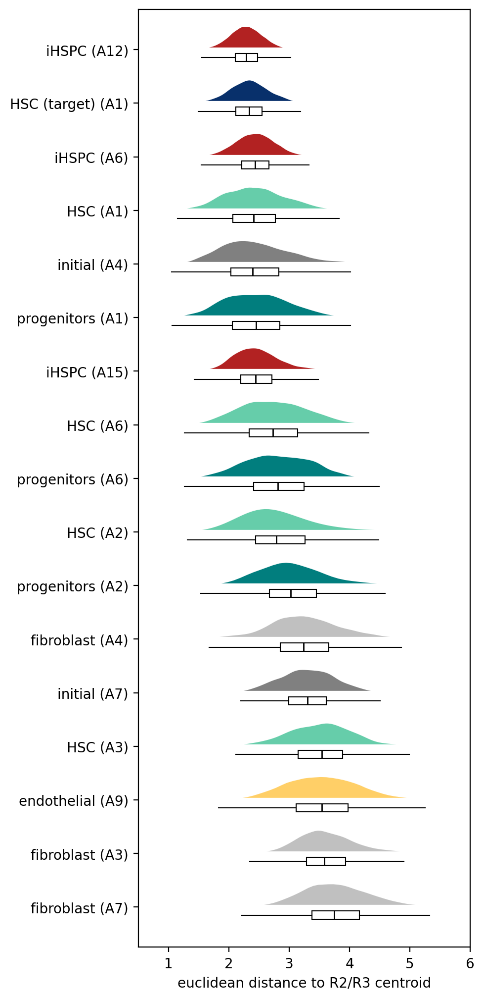

In [22]:
# grouping_key = 'groups_of_interest'


# pairs_to_plot = [
#     ('A1', 'HSC'), # our HSCs
    
#     ('A1', 'hsc'), # reference HSCs
#     ('A2', 'hsc'),
#     ('A3', 'hsc'),
#     ('A6', 'hsc'),
    
#     ('A4', 'initial'), # our fibroblasts
#     ('A7', 'initial'),
    
#     ('A7', 'fibroblasts'), # reference fibroblasts
#     ('A4', 'fibroblasts'),
#     ('A3', 'fibroblasts'),
    
#     ('A6', 'HSPCs'), # Ng HSPCs
#     ('A12', 'HSPCs'),
#     ('A15', 'HSPCs'),
    
#     ('A2', 'hematopoietic_progenitors'), # reference HSPCs
#     ('A6', 'hematopoietic_progenitors'),
#     ('A1', 'hematopoietic_progenitors'),
    
#     ('A9', 'endothelial_cells'), # reference endothelial
# ]

# adata.obs['cluster'] = adata.obs['cluster'].astype(str)
# adata.obs['groups_of_interest'] = adata.obs['groups_of_interest'].astype(str)

# adata.obs['joint'] = adata.obs['groups_of_interest'] + " (" + adata.obs['cluster'] + ")"
# groups_to_plot = [f"{group} ({clust})" for clust, group in pairs_to_plot]


# df = adata.obs[adata.obs['joint'].isin(groups_to_plot)].copy()

# plot_df = pd.DataFrame({
#     "distance": df[f"dist_to_{cluster}_centroid"], 
#     "joint": df["joint"]
# })

# # Sort cluster order for plot
# mean_distances = plot_df.groupby("joint")["distance"].mean().sort_values()
# group_order = mean_distances.index.tolist()  # ascending order
# plot_df["joint"] = pd.Categorical(plot_df["joint"], categories=group_order, ordered=True)


# group_order = group_order[::-1]


# palette = {
#     'initial': '#808080',
#     'fibroblasts': 'silver',
#     'HSC': '#08306B',
#     'hsc': '#66CDAA',
#     'hematopoietic_progenitors': '#017E7E',
#     'HSPCs': 'firebrick',
#     'endothelial_cells': '#FFCF67',
# }

# def group_from_joint(j):
#     return j.split(" (")[0]

# group_colors = [palette[group_from_joint(g)] for g in group_order]

# # group_colors = plt.get_cmap('managua')(np.linspace(0, 1, len(group_order)))


# label_map = {
#     'fibroblasts (A7)': 'fibroblast (A7)',
#     'fibroblasts (A3)': 'fibroblast (A3)',
#     'endothelial_cells (A9)': 'endothelial (A9)',
#     'hsc (A3)': 'HSC (A3)',
#     'initial (A7)': 'initial (A7)',
#     'fibroblasts (A4)': 'fibroblast (A4)',
#     'hematopoietic_progenitors (A2)': 'progenitors (A2)',
#     'hsc (A2)': 'HSC (A2)',
#     'hematopoietic_progenitors (A6)': 'progenitors (A6)',
#     'hsc (A6)': 'HSC (A6)',
#     'HSPCs (A15)': 'iHSPC (A15)',
#     'hematopoietic_progenitors (A1)': 'progenitors (A1)',
#     'initial (A4)': 'initial (A4)',
#     'hsc (A1)': 'HSC (A1)',
#     'HSPCs (A6)': 'iHSPC (A6)',
#     'HSC (A1)': 'HSC (target) (A1)',
#     'HSPCs (A12)': 'iHSPC (A12)',
# }


# violin_width = 0.85
# box_width = 0.15
# offset = -0.15

# fig, ax = plt.subplots(figsize=(5, len(group_order) * 0.6), dpi=200)

# for i, (group, color) in enumerate(zip(group_order, group_colors)):
#     vals = plot_df.loc[plot_df["joint"] == group, "distance"].dropna()
#     y_pos = i  # y-axis position for current group

#     # --- Half Violin (right half only) ---
#     # quantiles = [[0.02, 0.98]]
#     parts = ax.violinplot(
#         vals, positions=[y_pos],
#         vert=False,  # horizontal!
#         widths=violin_width,
#         showmeans=False, showmedians=False, showextrema=False,
#         # quantiles=quantiles,
#     )
#     for pc in parts['bodies']:
#         verts = pc.get_paths()[0].vertices
#         mean_y = np.mean(verts[:, 1])
#         verts[:, 1] = np.maximum(verts[:, 1], mean_y)  # keep right half
#         pc.set_facecolor(color)
#         pc.set_alpha(1)

#     # --- Boxplot (offset slightly up for visual separation) ---
#     box = ax.boxplot(
#         vals, positions=[y_pos + offset],
#         vert=False,
#         widths=box_width,
#         patch_artist=True,
#         showcaps=False, showfliers=False,
#         whiskerprops={"linewidth": 0.75},
#         medianprops={"color": "black", "linewidth": 1},
#         boxprops={'facecolor': 'white', 'edgecolor': "black", 'linewidth': 0.75},
#     )

# for i in range(len(group_order)):
#     ax.axhline(i, color='white', linewidth=3, zorder=1)
    
# ax.set_xlim([0.5, 6])
# # Set y-ticks/labels
# ax.set_ylim(-0.75, len(group_order) - 0.25)
# ax.set_yticks(range(len(group_order)))
# new_labels = [label_map.get(old, old) for old in group_order]
# ax.set_yticklabels(new_labels, fontsize=10)
# # ax.set_yticklabels(group_order, fontsize=10)
# ax.set_ylabel("")
# ax.set_xlabel(f"euclidean distance to {cluster} centroid")
# plt.tight_layout()
# plt.show()

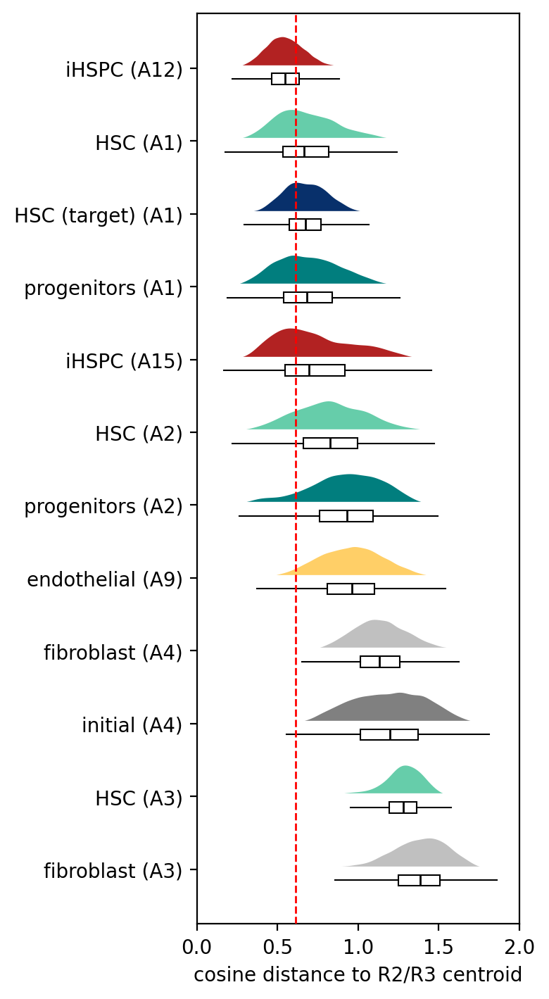

In [27]:
grouping_key = 'groups_of_interest'


pairs_to_plot = [
    ('A1', 'HSC'), # our HSCs
    
    ('A1', 'hsc'), # reference HSCs
    ('A2', 'hsc'),
    ('A3', 'hsc'),
    # ('A6', 'hsc'),
    
    ('A4', 'initial'), # our fibroblasts
    # ('A7', 'initial'),
    
    # ('A7', 'fibroblasts'), # reference fibroblasts
    ('A4', 'fibroblasts'),
    ('A3', 'fibroblasts'),
    
    # ('A6', 'HSPCs'), # Ng HSPCs
    ('A12', 'HSPCs'),
    ('A15', 'HSPCs'),
    
    ('A2', 'hematopoietic_progenitors'), # reference HSPCs
    # ('A6', 'hematopoietic_progenitors'),
    ('A1', 'hematopoietic_progenitors'),
    
    ('A9', 'endothelial_cells'), # reference endothelial
]

adata.obs['cluster'] = adata.obs['cluster'].astype(str)
adata.obs['groups_of_interest'] = adata.obs['groups_of_interest'].astype(str)

adata.obs['joint'] = adata.obs['groups_of_interest'] + " (" + adata.obs['cluster'] + ")"
groups_to_plot = [f"{group} ({clust})" for clust, group in pairs_to_plot]


df = adata.obs[adata.obs['joint'].isin(groups_to_plot)].copy()

plot_df = pd.DataFrame({
    "distance": df[f"dist_to_{cluster}_centroid"], 
    "joint": df["joint"]
})

# Sort cluster order for plot
sort_param = 'median'

if sort_param == 'median':
    mean_distances = plot_df.groupby("joint")["distance"].median().sort_values()
else:
    # default to sorting by mean
    mean_distances = plot_df.groupby("joint")["distance"].mean().sort_values()
    
group_order = mean_distances.index.tolist()  # ascending order
plot_df["joint"] = pd.Categorical(plot_df["joint"], categories=group_order, ordered=True)


group_order = group_order[::-1]


palette = {
    'initial': '#808080',
    'fibroblasts': 'silver',
    'HSC': '#08306B',
    'hsc': '#66CDAA',
    'hematopoietic_progenitors': '#017E7E',
    'HSPCs': 'firebrick',
    'endothelial_cells': '#FFCF67',
}

def group_from_joint(j):
    return j.split(" (")[0]

group_colors = [palette[group_from_joint(g)] for g in group_order]

# group_colors = plt.get_cmap('managua')(np.linspace(0, 1, len(group_order)))


label_map = {
    'fibroblasts (A7)': 'fibroblast (A7)',
    'fibroblasts (A3)': 'fibroblast (A3)',
    'endothelial_cells (A9)': 'endothelial (A9)',
    'hsc (A3)': 'HSC (A3)',
    'initial (A7)': 'initial (A7)',
    'fibroblasts (A4)': 'fibroblast (A4)',
    'hematopoietic_progenitors (A2)': 'progenitors (A2)',
    'hsc (A2)': 'HSC (A2)',
    'hematopoietic_progenitors (A6)': 'progenitors (A6)',
    'hsc (A6)': 'HSC (A6)',
    'HSPCs (A15)': 'iHSPC (A15)',
    'hematopoietic_progenitors (A1)': 'progenitors (A1)',
    'initial (A4)': 'initial (A4)',
    'hsc (A1)': 'HSC (A1)',
    'HSPCs (A6)': 'iHSPC (A6)',
    'HSC (A1)': 'HSC (target) (A1)',
    'HSPCs (A12)': 'iHSPC (A12)',
}


violin_width = 0.85
box_width = 0.15
offset = -0.15

fig, ax = plt.subplots(figsize=(4, len(group_order) * 0.6), dpi=200)

for i, (group, color) in enumerate(zip(group_order, group_colors)):
    vals = plot_df.loc[plot_df["joint"] == group, "distance"].dropna()
    y_pos = i  # y-axis position for current group

    # --- Half Violin (right half only) ---
    # quantiles = [[0.02, 0.98]]
    parts = ax.violinplot(
        vals, positions=[y_pos],
        vert=False,  # horizontal!
        widths=violin_width,
        showmeans=False, showmedians=False, showextrema=False,
        # quantiles=quantiles,
    )
    for pc in parts['bodies']:
        verts = pc.get_paths()[0].vertices
        mean_y = np.mean(verts[:, 1])
        verts[:, 1] = np.maximum(verts[:, 1], mean_y)  # keep right half
        pc.set_facecolor(color)
        pc.set_alpha(1)

    # --- Boxplot (offset slightly up for visual separation) ---
    box = ax.boxplot(
        vals, positions=[y_pos + offset],
        vert=False,
        widths=box_width,
        patch_artist=True,
        showcaps=False, showfliers=False,
        whiskerprops={"linewidth": 0.75},
        medianprops={"color": "black", "linewidth": 1},
        boxprops={'facecolor': 'white', 'edgecolor': "black", 'linewidth': 0.75},
    )

for i in range(len(group_order)):
    ax.axhline(i, color='white', linewidth=3, zorder=1)
    
# add line for mean distance to self (calculated below) 
if distance_metric == 'euclidean':
    ax.axvline(x=1.81837, color='red', ls='--', lw=1, zorder=5)
elif distance_metric == 'cosine':
    ax.axvline(x=0.61307, color='red', ls='--', lw=1, zorder=5)
else:
    raise ValueError(f"Unknown distance metric: {distance_metric}")

if distance_metric == 'euclidean':
    ax.set_xlim([0.5, 6])
elif distance_metric == 'cosine':
    ax.set_xlim([0, 2])
else:
    raise ValueError(f"Unknown distance metric: {distance_metric}")

ax.set_ylim(-0.75, len(group_order) - 0.25)
ax.set_yticks(range(len(group_order)))
new_labels = [label_map.get(old, old) for old in group_order]
ax.set_yticklabels(new_labels, fontsize=10)
ax.set_ylabel("")
ax.set_xlabel(f"{distance_metric} distance to {cluster} centroid")

plt.tight_layout()
plt.show()

In [25]:
# get distances to self

pairs_to_plot = [
    ('A1', 'R2'),
    ('A1', 'R3'),
]
    
adata.obs['cluster'] = adata.obs['cluster'].astype(str)
adata.obs['groups_of_interest'] = adata.obs['groups_of_interest'].astype(str)

adata.obs['joint'] = adata.obs['groups_of_interest'] + " (" + adata.obs['cluster'] + ")"
groups_to_plot = [f"{group} ({clust})" for clust, group in pairs_to_plot]


df = adata.obs[adata.obs['joint'].isin(groups_to_plot)].copy()

plot_df = pd.DataFrame({
    "distance": df[f"dist_to_{cluster}_centroid"], 
    "joint": df["joint"]
})

# Sort cluster order for plot
mean_distances = plot_df.groupby("joint")["distance"].mean().sort_values()
print(mean_distances.head())

median_distances = plot_df.groupby("joint")["distance"].median().sort_values()
print(median_distances.head())

print(f"\nMean mean distance: {mean_distances.mean()}")
print(f"Mean median distance: {median_distances.mean()}")

joint
R3 (A1)    0.597869
R2 (A1)    0.628273
Name: distance, dtype: float32
joint
R3 (A1)    0.597646
R2 (A1)    0.639244
Name: distance, dtype: float32

Mean mean distance: 0.6130709648132324
Mean median distance: 0.6184452772140503


In [16]:
# euclidean
print(f" Mean mean distance: {mean_distances.mean()}")
print(f" Mean median distance: {median_distances.mean()}")

 Mean mean distance: 1.8183698654174805
 Mean median distance: 1.7469420433044434


# PAGA

In [21]:
adata

AnnData object with n_obs × n_vars = 420108 × 24
    obs: 'annotation', 'cell_type', 'tissue', 'development_stage', 'basename', 'dataset_id', 'data_key', 'data_source', 'celltype', 'source', 'batch_key', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'leiden', 'cluster', 'atlas_grouping', 'broad_grouping', 'groups_of_interest', 'dist_to_R2/R3_centroid', 'joint'
    uns: 'annotation_colors', 'basename_colors', 'cluster_colors', 'data_key_colors', 'leiden', 'neighbors', 'pca', 'umap', 'groups_of_interest_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'dist

/nfs/turbo/umms-indikar/Jillian/conda-envs/rapids/lib/python3.13/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


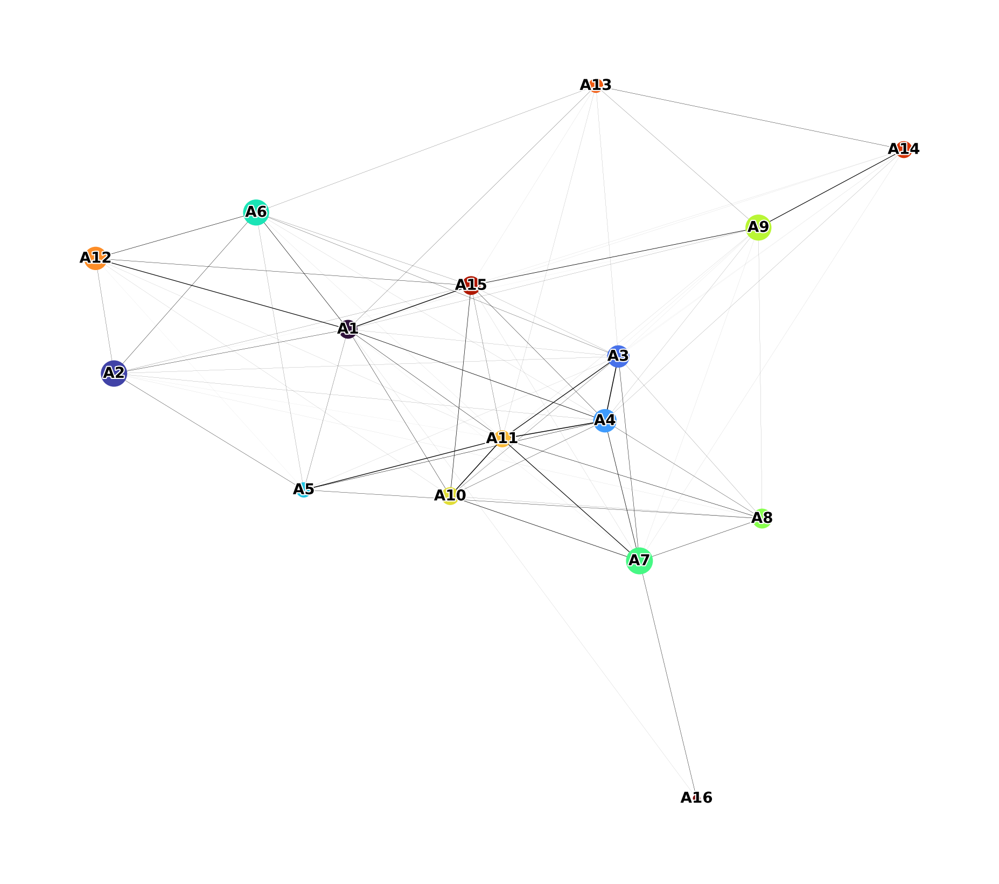

CPU times: user 10.1 s, sys: 1.17 s, total: 11.3 s
Wall time: 13.7 s


In [5]:
%%time
n_neighbors = 15
paga_group_column = "cluster"
n_pcs = 50

embed = adata.copy()

rsc.get.anndata_to_GPU(embed)

rsc.pp.neighbors(
    embed, 
    n_pcs=n_pcs, 
    n_neighbors=n_neighbors,
)

# plot the embedding
sc.tl.paga(embed, groups=paga_group_column)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 10
sc.pl.paga(
    embed, 
    fontoutline=1.5, 
    edge_width_scale=0.15,  
    frameon=False,          
)

embed.obsm['X_paga'] = get_init_pos_from_paga(embed)

Graph with 16 nodes and 110 edges


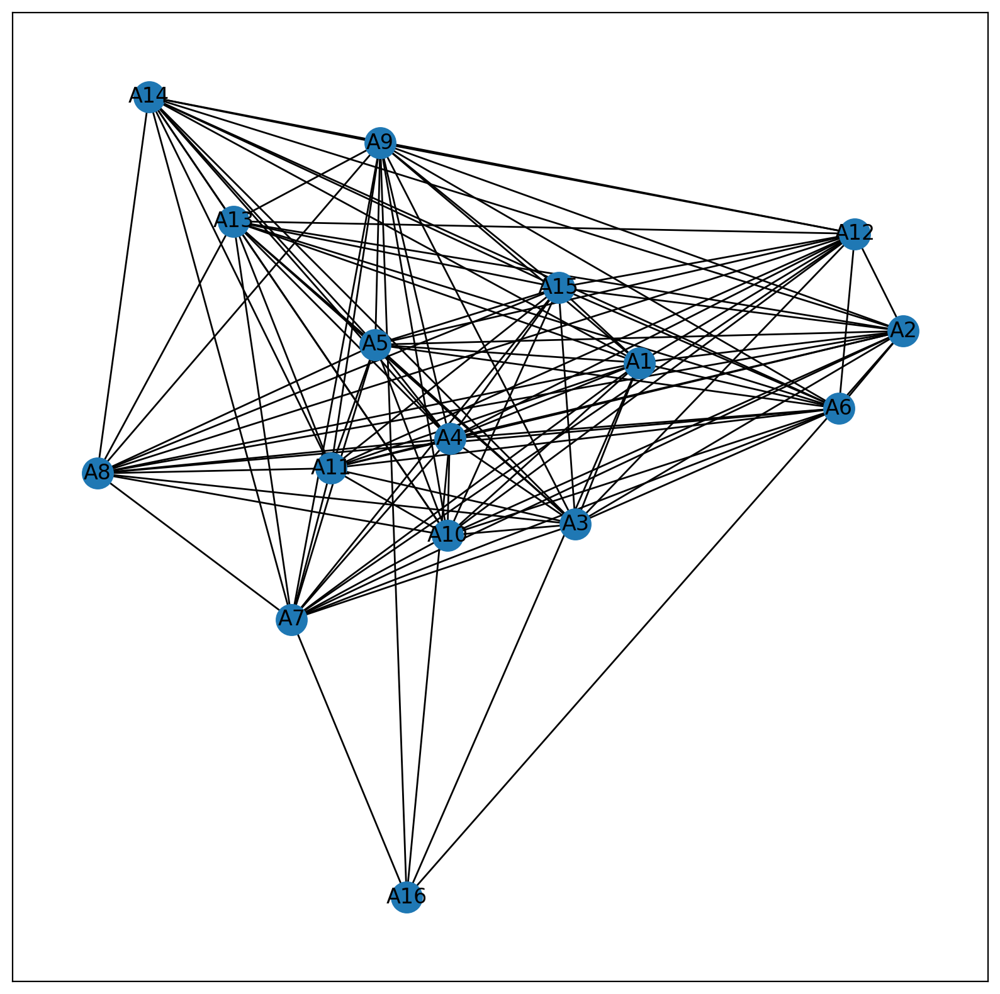

In [6]:
import networkx as nx
def paga_to_networkx(adata):
    """
    Build a NetworkX graph from adata.uns['paga'].
    
        
    Returns
    -------
    G : networkx.Graph
        Weighted undirected graph (nodes = clusters, edges = PAGA connectivity).
    """
    # Get PAGA connectivity and cluster names
    conn = adata.uns['paga']['connectivities']
    group_key = adata.uns['paga']['groups']
    clusters = adata.obs[group_key].cat.categories

    matrix = pd.DataFrame(
        adata.uns['paga']['connectivities'].todense().copy(),
        index=clusters.values,
        columns=clusters.values,
    )

    G = nx.from_pandas_adjacency(matrix)
    G.pos = adata.uns['paga']['pos'].copy()
    return G

G = paga_to_networkx(embed)
print(G)
nx.draw_networkx(G)

In [18]:
cluster_key = 'cluster'

# Ensure cluster is categorical
adata.obs[cluster_key] = adata.obs[cluster_key].astype('category')

# Extract cluster names (in category order)
clusters = adata.obs[cluster_key].cat.categories

# Extract colors (Scanpy stores them in the same order)
colors = adata.uns[f'{cluster_key}_colors']

# Count cells per cluster
counts = adata.obs[cluster_key].value_counts().reindex(clusters)

# Build dataframe
df_clusters = pd.DataFrame({
    'cluster': clusters,
    'color': colors,
    'n_cells': counts.values
})

df_clusters

,cluster,color,n_cells
0,A1,#30123b,13989
1,A2,#4143a7,59003
2,A3,#4771e9,29257
3,A4,#3e9bfe,35555
4,A5,#22c5e2,5588
5,A6,#1ae4b6,56063
6,A7,#46f884,64489
7,A8,#88ff4e,17670
8,A9,#b9f635,56096
9,A10,#e1dd37,10990


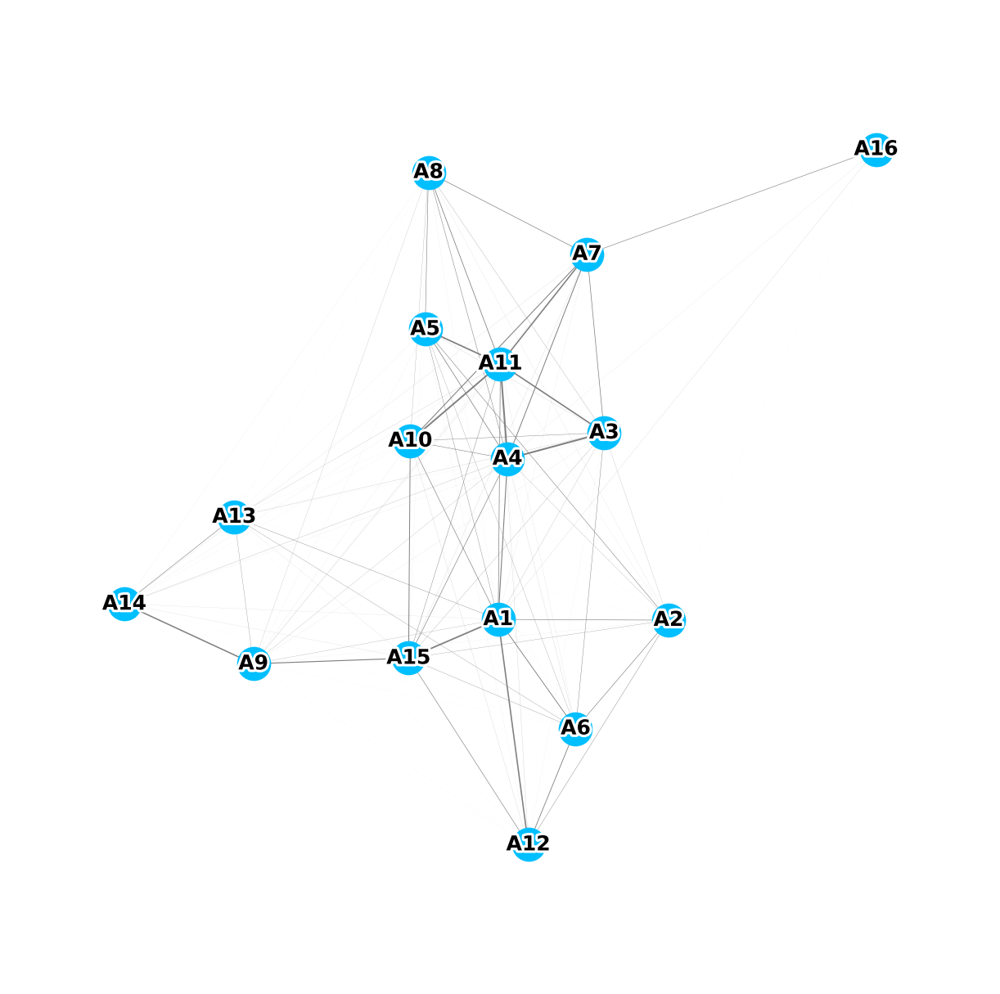

In [16]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

# Plot
pos = nx.spring_layout(G, seed=2)
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

nx.draw_networkx_edges(
    G, 
    pos,
    edgelist=edges,
    edge_color='grey',
    width=np.array(weights),
)
nx.draw_networkx_nodes(
    G, pos, 
    node_color='deepskyblue', 
    node_size=100, 
    edgecolors='black',   
    linewidths=0
)

# Draw labels with white border (stroke)
# label_dict = {n: n.lower().replace("_", " ") for n in G.nodes}
label_dict = {n: n.replace("_", " ") for n in G.nodes}
# how much to shift down in layout‐units:
y_off = 0#0.025

# build new label positions
label_pos = {n: (x, y - y_off) for n, (x, y) in pos.items()}

# then draw labels at the shifted locations
labels = nx.draw_networkx_labels(
    G,
    label_pos,
    labels=label_dict,
    font_size=6,
    font_weight='bold',
    verticalalignment='center',  # keep the text anchored at its top
    horizontalalignment='center',
)

for _, t in labels.items():
    t.set_path_effects([
        pe.Stroke(linewidth=1.5, foreground='white'),
        pe.Normal()
    ])

plt.axis('off')
xs, ys = zip(*pos.values())
pad = 0.25
ax = plt.gca()
ax.set_xlim(min(xs)-pad, max(xs)+pad)
ax.set_ylim(min(ys)-pad, max(ys)+pad)
ax.set_facecolor('none')    # axes background
plt.gcf().set_facecolor('none')    # figure background
plt.show()

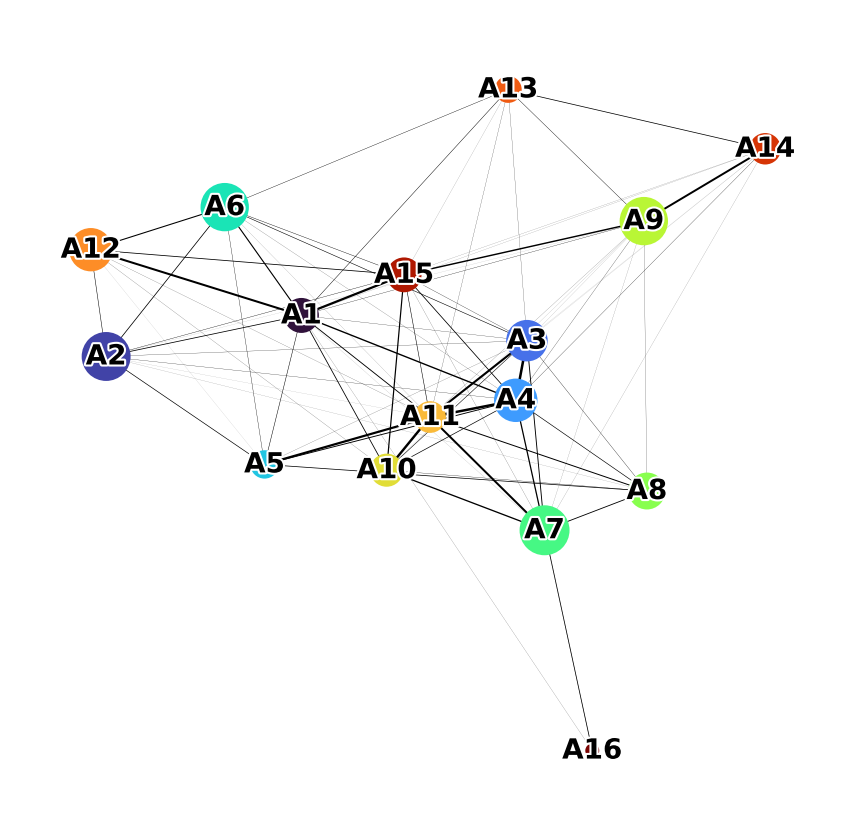

In [20]:
sc.tl.paga(adata, groups='cluster')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5
ax = sc.pl.paga(
    adata, 
    fontoutline=1.5, 
    edge_width_scale=0.25,  
    frameon=False,  
    show=False,
)

ax.set_facecolor('none')    # axes background
plt.gcf().set_facecolor('none')    # figure background

In [25]:
adata.obs['annotation'].value_counts()

annotation
HSPC1                                                               35304
fibroblast                                                          28680
Mye Pro1                                                            22918
mesenchymal cell                                                    21120
EMK Pro1                                                            17942
                                                                    ...  
cerebral cortex endothelial cell                                       18
fibroblast of connective tissue of nonglandular part of prostate       17
lung perichondrial fibroblast                                          10
cord blood hematopoietic stem cell                                      5
dermis microvascular lymphatic vessel endothelial cell                  1
Name: count, Length: 101, dtype: int64

In [27]:
from collections import Counter

df = adata.obs.copy()
cluster_column = 'cluster'

rows = []

for cluster, group in df.groupby(cluster_column):
    total = len(group)

    # Get top 10 (annotation, data_key) pairs
    pairs = list(zip(group['annotation'], group['data_key']))
    top10 = Counter(pairs).most_common(5)

    for (ann, dk), count in top10:
        rows.append({
            'cluster': cluster,
            'annotation': ann,
            'data_key': dk,
            'count': count,
            'proportion': round(count / total, 3)
        })

# Create DataFrame
summary_df = pd.DataFrame(rows)

# Optional: sort by cluster and count
summary_df = summary_df.sort_values(['cluster', 'count'], ascending=[True, False])

# Display
print(f"{summary_df.shape=}")

outpath = "../results/reference_clusters.tex"

summary_df.to_latex(
    outpath,
    index=False,
    longtable=True,
    escape=True,  # set to True if your data has LaTeX-sensitive characters
    caption="Top 10 annotation-data_key pairs by cluster.",
    label="tab:cluster_summary"
)

summary_df.head()

/tmp/ipykernel_1678108/2377608152.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for cluster, group in df.groupby(cluster_column):


summary_df.shape=(79, 5)


,cluster,annotation,data_key,count,proportion
0,A1,R2,This Study,3924,0.281
1,A1,hematopoietic multipotent progenitor cell,Reference,2736,0.196
2,A1,HSC,This Study,1343,0.096
3,A1,hematopoietic stem cell,Reference,1142,0.082
4,A1,R1,This Study,1004,0.072


In [28]:
df = adata.obs.copy()

cluster_column = 'cluster'

for cluster, group in df.groupby(cluster_column):
    print(f"\n ===== Cluster: {cluster} ===== ")

    # Get (annotation, data_key) pairs
    pairs = list(zip(group['annotation'], group['data_key']))
    top10 = Counter(pairs).most_common(10)
    total = len(group)

    # Format: "annotation (data_key, proportion)"
    print("\nTop 10 cell types:")
    for (ann, dk), count in top10:
        prop = count / total
        print(f"\t{ann} ({dk}, {prop:.3f})")
    
    counts = group['data_key'].value_counts()
    norm = group['data_key'].value_counts(normalize=True).round(3)
    
    # Combine into one DataFrame
    summary = pd.DataFrame({
        'count': counts,
        'proportion': norm
    })
    print()
    print(summary.to_string())


 ===== Cluster: A1 ===== 

Top 10 cell types:
	R2 (This Study, 0.281)
	hematopoietic multipotent progenitor cell (Reference, 0.196)
	HSC (This Study, 0.096)
	hematopoietic stem cell (Reference, 0.082)
	R1 (This Study, 0.072)
	progenitors (This Study, 0.069)
	R3 (This Study, 0.034)
	megakaryocyte-erythroid progenitor cell (Reference, 0.021)
	hematopoietic precursor cell (Reference, 0.020)
	HSPC1 (Ng 2024, 0.019)

            count  proportion
data_key                     
This Study   7759       0.555
Reference    5383       0.385
Ng 2024       847       0.061
Gomes 2018      0       0.000

 ===== Cluster: A2 ===== 

Top 10 cell types:
	EMK Pro1 (Ng 2024, 0.206)
	Mega (Ng 2024, 0.195)
	EMK Pro2 (Ng 2024, 0.150)
	Eos (Ng 2024, 0.145)
	Gran (Ng 2024, 0.087)
	erythroid progenitor cell (Reference, 0.046)
	megakaryocyte-erythroid progenitor cell (Reference, 0.032)
	HSPC1 (Ng 2024, 0.027)
	HSPC3 (Ng 2024, 0.019)
	hematopoietic stem cell (Reference, 0.013)

            count  proportion
data_

/tmp/ipykernel_1678108/1048999319.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for cluster, group in df.groupby(cluster_column):


# Distance matrix 

In [8]:
%%time
# X = embed.obsm['X_pca']
# print(f"{X.shape=}")

# dists = pairwise_distances(X, metric='euclidean')
# print(f"{dists.shape=}")

# # df = pd.DataFrame(
# #     dists, 
# #     index=embed.obs['level3'].values,
# #     columns=embed.obs['level3'].values,
# # )

# df = pd.DataFrame(
#     dists, 
#     index=embed.obs['cluster'].values,
#     columns=embed.obs['cluster'].values,
# )

# df = df.groupby(level=0, axis=0).mean().groupby(level=0, axis=1).mean()
# df = df[keep].loc[keep]
# df = (df - df.values.min()) / (df.values.max() - df.values.min())
# # df.index = df.index.str.lower().str.replace("_", " ")
# # df.columns = df.columns.str.lower().str.replace("_", " ")
# print(f"{df.shape=}")

# df.head()

sdata = sc.get.aggregate(adata, by='cluster', func='mean')
sdata.X = sdata.layers['mean']

X = sdata.X
print(f"{X.shape=}")

dists = pairwise_distances(X, metric='euclidean')
print(f"{dists.shape=}")

df = pd.DataFrame(
    dists, 
    index=sdata.obs['cluster'].values,
    columns=sdata.obs['cluster'].values,
)

df.head()

X.shape=(16, 24)
dists.shape=(16, 16)
CPU times: user 49.2 ms, sys: 32.9 ms, total: 82.1 ms
Wall time: 103 ms


,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12,A13,A14,A15,A16
A1,0.000000,1.877387,2.274418,2.056977,2.133250,1.654682,2.685098,2.912463,2.065027,1.748483,2.684723,1.446757,2.918959,2.949330,1.360313,8.594848
A2,1.877387,0.000000,2.617623,2.241557,1.734675,2.071547,3.290637,2.674695,2.968812,2.743402,3.225326,2.353032,3.677698,3.691512,2.551405,8.984177
A3,2.274418,2.617623,0.000000,1.478652,2.088545,1.919636,2.027064,2.764638,2.821387,2.105537,2.244522,2.894236,2.958812,3.108767,2.761006,8.647855
A4,2.056977,2.241557,1.478652,0.000000,1.880903,1.999478,1.521430,2.292839,2.688493,1.685466,1.947533,2.407747,3.399667,3.167462,2.361099,8.120064
A5,2.133250,1.734675,2.088545,1.880903,0.000000,1.625557,2.841415,2.648935,3.274835,2.544639,2.445981,2.334972,3.487164,3.447987,3.114584,8.676833


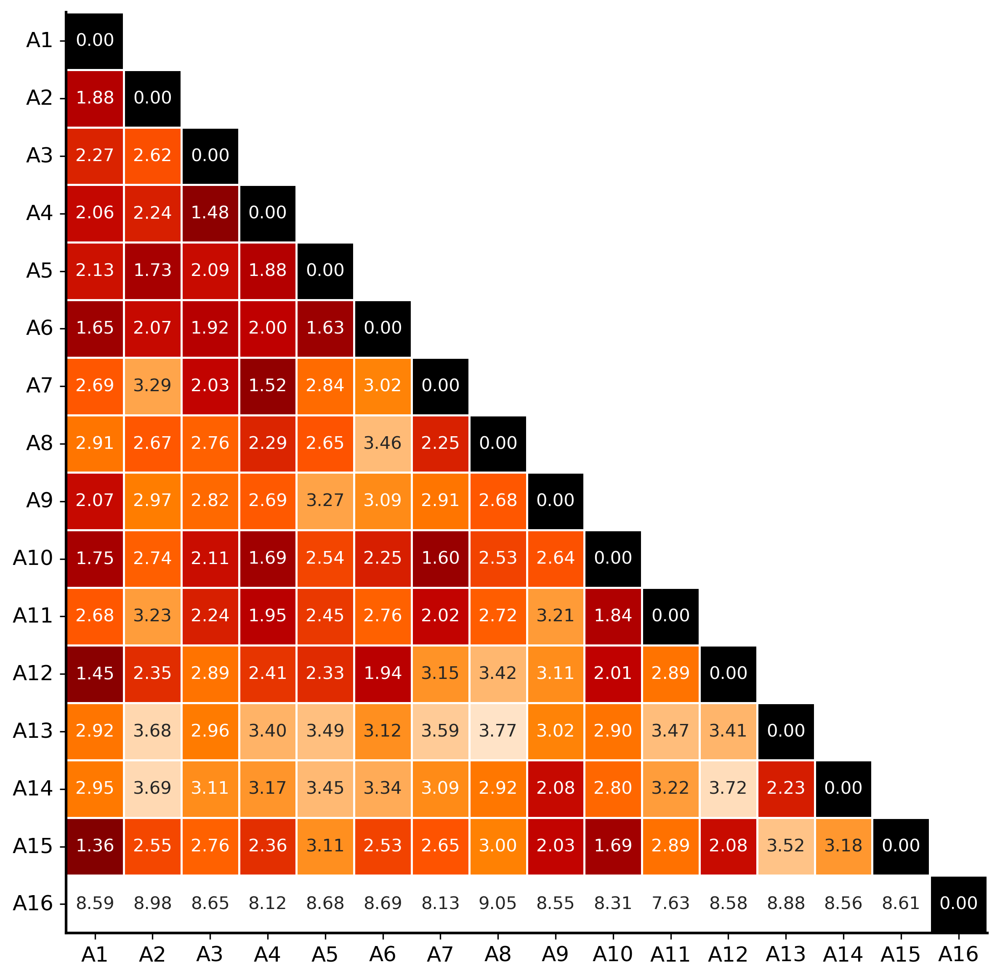

In [24]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 8

# order = [
#     'initial',
#     'Fibroblast',   
#     'R1', 'R2', 'R3',    
#     'Mesenchymal Progenitor',
#     # 'Mesenchymal Stem Cell',
#     'Endothelial Cell',   
#     'target',#'HSC',
#     'Hematopoietic Stem Cell',
#     'Hematopoietic Progenitor',
#     'progenitors',
#     'Multipotent Progenitor',
#     # 'MPP',
#     # 'CMP',
#     'Myeloid Progenitor',
#     # 'GMP', 
#     'Lymphoid Progenitor',
#     # 'LMPP',
#     # 'CLP',
#     'B Cell Progenitor',
#     'Erythroid Progenitor',
#     'Erythrocyte',
#     # 'MEG-ERY',
#     'Megakaryocyte Progenitor',
#     'Megakaryocyte',
# ]

pdf = df.copy()

# establish sort order
# pdf = pdf[order].reindex(order)
mask = np.triu(np.ones_like(pdf, dtype=bool), k=1)

sns.heatmap(
    pdf, square=True,
    mask=mask,
    cmap='gist_heat',
    linewidth=0.75,
    annot=True,
    fmt=".2f",
    annot_kws={'fontsize' : 10},
    cbar=False,
    vmin=0, 
    vmax=4,
)

# plt.xticks([])
plt.xlabel("")
plt.ylabel("")

plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=12)

ax = plt.gca()

# Show only left and bottom spines
for spine in ['left', 'bottom']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_color('black')
    ax.spines[spine].set_linewidth(1.5)

# Hide top and right spines (optional, but usually cleaner)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()